# Final qualitative results notebook — reference/default-style PySTEPS

This notebook reproduces the final qualitative thesis figures for the four
fixed 2021 test cases. Neural forecasts use the final selected checkpoints.
Probabilistic comparisons use 20-member ensemble means. PySTEPS uses the
final AR(2) configuration with the latest three radar fields.

In [1]:
from pathlib import Path
import os
import sys
import re
import gc
import inspect
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import yaml

%matplotlib inline

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

REGION = "belgium"
TIN = 4
TOUT = 20
TARGET_SIZE = 704

# Final thesis qualitative events.
QUAL_CASES = [
    ("Intense convection", 465264, "2021-06-04 12:00:00"),
    ("Widespread organized rainfall", 428616, "2021-01-28 06:00:00"),
    ("Rapidly evolving rainfall", 473904, "2021-07-04 12:00:00"),
    ("July 2021 flood event", 476568, "2021-07-13 18:00:00"),
]

EVAL_EVENT_TS = [t for _, t, _ in QUAL_CASES]
LDCAST_EVENT_TS = EVAL_EVENT_TS.copy()
MAIN_EVENT_T = 465264

# Thesis comparison leads: +25, +50, +100 min.
QUAL_FRAMES_TO_PLOT = (4, 9, 19)

RANDOM_MEMBER_SEED = 42
N_RANDOM_MEMBERS = 4

EVENT_LABELS = {t: ts for _, t, ts in QUAL_CASES}
EVENT_REGIME_LABELS = {t: name for name, t, _ in QUAL_CASES}

def event_key(t_start):
    return f"t{int(t_start)}"

def event_title(t_start):
    return f"{event_key(t_start)} | {EVENT_LABELS.get(int(t_start), 'unknown time')}"

# Repositories / data.
MLCAST_DIR = Path("/data/brussel/114/vsc11442/code/mlcast-ldcast")
UNET_ROOT = Path("/data/brussel/114/vsc11442/code/mlcast-unet")
UNET_SRC = UNET_ROOT / "src"
ENS_DIR = Path("/data/brussel/114/vsc11442/code/convgru-ensemble")
SCRATCH_DIR = Path(os.environ.get("VSC_SCRATCH", "/scratch/brussel/114/vsc11442"))

FULL_CONFIG = str(MLCAST_DIR / "src" / "new_config_data_sampled.yaml")

# ConvGRU checkpoints used in the thesis.
ENS_LOG_ROOT = ENS_DIR / "logs" / "CRPS_4past-20fut_noise"
RUN_10pct_ens_resume = ENS_LOG_ROOT / "job12854430_4past-20fut_noise_bs32_lr1e-05_resume_to30_from_job12369419"
RUN_full_ens_resume = ENS_LOG_ROOT / "job12854429_4past-20fut_noise_bs32_lr1e-05_resume_to3_from_job12369418"

CONVGRU_CKPTS = {
    "ConvGRU 10%": MLCAST_DIR / "results/convgru/convgru_10pct_b32_crop256/best-epoch17-step613836.ckpt",
    "ConvGRU full": MLCAST_DIR / "results/convgru/convgru_full_b32_crop256/best-epoch01-step680812.ckpt",
    "ConvGRU ensemble 10%": RUN_10pct_ens_resume / "checkpoints/best-val-4past-20fut_noise_bs32_lr1e-05_epepoch=029_lossval_loss=0.0726.ckpt",
    "ConvGRU ensemble full": RUN_full_ens_resume / "checkpoints/best-val-4past-20fut_noise_bs32_lr1e-05_epepoch=002_lossval_loss=0.0728.ckpt",
}

# U-Net run directories and final selected epochs.
UNET_RUN_DIRS = {
    "U-Net 10%": UNET_ROOT / "logs/unet_10pct_crop256_b32",
    "U-Net full": UNET_ROOT / "logs/unet_full_crop256_b32",
    "U-Net ensemble 10%": UNET_ROOT / "logs/stoch_unet_10pct_crop128_b32",
    "U-Net ensemble full": UNET_ROOT / "logs/stoch_unet_full_crop128_b32",
}

UNET_SELECTED_EPOCHS = {
    "U-Net 10%": 43,
    "U-Net full": 4,
    "U-Net ensemble 10%": 47,
    "U-Net ensemble full": 3,
}

THESIS_QUAL_DIR = MLCAST_DIR / "results" / "qualitative_figures"
THESIS_QUAL_DIR.mkdir(parents=True, exist_ok=True)

print("Device:", DEVICE)
print("Events:", EVAL_EVENT_TS)
print("Qualitative output:", THESIS_QUAL_DIR)

Device: cpu
Events: [465264, 428616, 473904, 476568]
Qualitative output: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures


## Shared data, conversion, and plotting helpers

In [2]:
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.ops import transform as shapely_transform

# Keep mlcast-ldcast first for ConvGRU/data helpers.
for p in [MLCAST_DIR, MLCAST_DIR / "src"]:
    p = str(p)
    if p not in sys.path:
        sys.path.insert(0, p)

from mlcast.modules import ConvGRU


# ------------------------------------------------------------------
# Basic YAML / precipitation conversion helpers
# ------------------------------------------------------------------

def load_yaml(path):
    with open(path, "r") as f:
        return yaml.safe_load(f)


DBZ_MEAN = 30.0
DBZ_STD = 30.0
DBZ_MIN = 0.0
DBZ_MAX = 60.0
ZR_A = 200.0
ZR_B = 1.6


def as_numpy(x):
    if isinstance(x, torch.Tensor):
        return x.detach().float().cpu().numpy()
    return np.asarray(x, dtype=np.float32)


def norm_to_dbz_np(x_norm):
    x_norm = as_numpy(x_norm)
    return x_norm * DBZ_STD + DBZ_MEAN


def dbz_to_rainrate_np(dbz):
    dbz = as_numpy(dbz)
    rr = np.full_like(dbz, np.nan, dtype=np.float32)
    valid = np.isfinite(dbz)
    dbz_valid = np.clip(dbz[valid], DBZ_MIN, DBZ_MAX)
    z = 10.0 ** (dbz_valid / 10.0)
    rr[valid] = (z / ZR_A) ** (1.0 / ZR_B)
    return rr


def to_rainrate_np(x_norm):
    return dbz_to_rainrate_np(norm_to_dbz_np(x_norm))


def rainrate_to_norm_dbz_np(rr, a=ZR_A, b=ZR_B):
    rr = np.asarray(rr, dtype=np.float32)
    norm = np.full_like(rr, np.nan, dtype=np.float32)

    valid = np.isfinite(rr)
    positive = valid & (rr > 0)

    dbz = np.zeros_like(rr, dtype=np.float32)
    dbz[positive] = 10.0 * np.log10(a * np.power(rr[positive], b))
    dbz = np.clip(dbz, DBZ_MIN, DBZ_MAX)

    norm[valid] = (dbz[valid] - DBZ_MEAN) / DBZ_STD
    return norm.astype(np.float32)


# ------------------------------------------------------------------
# Full-domain RADCLIM loading
# ------------------------------------------------------------------

def pad_last_two_dims_to_square(arr, target_size=TARGET_SIZE, fill_value=np.nan):
    arr = np.asarray(arr)
    h, w = arr.shape[-2], arr.shape[-1]

    if h > target_size or w > target_size:
        raise ValueError(f"Input domain {h}x{w} is larger than target {target_size}x{target_size}")

    pad_h = target_size - h
    pad_w = target_size - w

    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left

    pad_spec = [(0, 0)] * arr.ndim
    pad_spec[-2] = (pad_top, pad_bottom)
    pad_spec[-1] = (pad_left, pad_right)

    padded = np.pad(arr, pad_spec, mode="constant", constant_values=fill_value)

    return padded, {
        "original_h": h,
        "original_w": w,
        "pad_top": pad_top,
        "pad_bottom": pad_bottom,
        "pad_left": pad_left,
        "pad_right": pad_right,
        "target_size": target_size,
    }


def _radar_cfg_from_yaml_or_script(config_path, region=REGION):
    scripts_dir = MLCAST_DIR / "scripts"
    if str(scripts_dir) not in sys.path:
        sys.path.insert(0, str(scripts_dir))

    try:
        from Minh_read_mlcast_yaml import load_radar_cfg as _load_radar_cfg
        cfg = _load_radar_cfg(str(config_path), region)
        return cfg["zarr_path"], cfg["var_name"]
    except Exception:
        raw = load_yaml(config_path)
        radar = raw[region]["radar"]
        zarr_path = (
            radar.get("zarr_path")
            or radar.get("path")
            or radar.get("data_path")
            or radar.get("filename")
        )
        var_name = (
            radar.get("var_name")
            or radar.get("variable_name")
            or radar.get("standard_name")
            or "precip_intensity_EDK"
        )
        if zarr_path is None:
            raise KeyError(f"Could not find zarr path in {config_path}")
        return zarr_path, var_name


def load_full_domain_sequence_from_config(
    config_path=FULL_CONFIG,
    t_start=MAIN_EVENT_T,
    total_frames=TIN + TOUT,
    target_size=TARGET_SIZE,
):
    import xarray as xr

    zarr_path, var_name = _radar_cfg_from_yaml_or_script(config_path, REGION)
    ds = xr.open_zarr(zarr_path)

    rr = (
        ds[var_name]
        .isel(time=slice(int(t_start), int(t_start) + total_frames))
        .values
        .astype(np.float32)
    )

    norm = rainrate_to_norm_dbz_np(rr)
    norm_padded, pad_info = pad_last_two_dims_to_square(
        norm,
        target_size=target_size,
        fill_value=np.nan,
    )

    valid_mask = np.isfinite(norm_padded)
    model_input = np.where(valid_mask, norm_padded, -1.0).astype(np.float32)

    print(
        f"Loaded {event_title(t_start)} | "
        f"raw={rr.shape} padded={norm_padded.shape} "
        f"valid={valid_mask.mean():.3f}"
    )

    return (
        norm_padded.astype(np.float32),
        model_input,
        valid_mask,
        pad_info,
    )


# ------------------------------------------------------------------
# Common case structure
# ------------------------------------------------------------------

def make_case_dict(
    past_norm,
    truth_norm,
    samples_norm,
    t_start,
    model_name,
    mode="full_domain",
):
    samples_norm = np.asarray(samples_norm, dtype=np.float32)

    pred_mean = np.nanmean(samples_norm, axis=0).astype(np.float32)
    pred_std = (
        np.nanstd(samples_norm, axis=0).astype(np.float32)
        if samples_norm.shape[0] > 1
        else np.zeros_like(pred_mean, dtype=np.float32)
    )

    return {
        "past": np.asarray(past_norm, dtype=np.float32),
        "truth": np.asarray(truth_norm, dtype=np.float32),
        "samples": samples_norm,
        "pred_mean": pred_mean,
        "pred_std": pred_std,
        "tin": np.array(TIN),
        "tout": np.array(TOUT),
        "n_members": np.array(samples_norm.shape[0]),
        "t_start": np.array(int(t_start)),
        "model_name": np.array(str(model_name)),
        "mode": np.array(str(mode)),
    }


# ------------------------------------------------------------------
# Memory-safe rain-rate extraction from a case
# ------------------------------------------------------------------

def get_case_keys(case):
    if hasattr(case, "files"):
        return list(case.files)
    return list(case.keys())


def case_past_rainrate(case):
    return to_rainrate_np(np.asarray(case["past"], dtype=np.float32))


def case_truth_rainrate(case):
    return to_rainrate_np(np.asarray(case["truth"], dtype=np.float32))


def case_ensemble_mean_rainrate(case):
    keys = get_case_keys(case)

    # PySTEPS stores the exact ensemble mean directly in rain-rate space.
    if "pred_mean_rr" in keys:
        return np.asarray(case["pred_mean_rr"], dtype=np.float32)

    if "samples" not in keys:
        return to_rainrate_np(np.asarray(case["pred_mean"], dtype=np.float32))

    samples_norm = np.asarray(case["samples"], dtype=np.float32)

    if samples_norm.ndim != 4:
        raise ValueError(f"Expected samples [member,time,y,x], got {samples_norm.shape}")

    output_shape = samples_norm.shape[1:]
    sum_rr = np.zeros(output_shape, dtype=np.float32)
    count = np.zeros(output_shape, dtype=np.uint8)

    for member_idx in range(samples_norm.shape[0]):
        member_rr = to_rainrate_np(samples_norm[member_idx])
        valid = np.isfinite(member_rr)
        sum_rr[valid] += member_rr[valid]
        count[valid] += 1

    mean_rr = np.full(output_shape, np.nan, dtype=np.float32)
    valid_count = count > 0
    mean_rr[valid_count] = sum_rr[valid_count] / count[valid_count].astype(np.float32)

    return mean_rr


# ------------------------------------------------------------------
# Common precipitation plotting
# ------------------------------------------------------------------

def _get_precip_cmap_norm():
    color_list = [
        "white", "cyan", "deepskyblue", "dodgerblue", "blue",
        "chartreuse", "limegreen", "green", "darkgreen",
        "yellow", "gold", "orange", "red", "magenta", "darkmagenta",
    ]

    clevs = [
        0.0, 0.1, 0.25, 0.4, 0.63, 1, 1.6, 2.5,
        4, 6.3, 10, 16, 25, 40, 63, 100,
    ]

    cmap_precip = mcolors.ListedColormap(color_list)
    cmap_precip.set_bad(color=(1, 1, 1, 0))
    norm_precip = mcolors.BoundaryNorm(clevs, cmap_precip.N, clip=True)

    return cmap_precip, norm_precip, "eq. mm/hr", clevs


PRECIP_CMAP, PRECIP_NORM, PRECIP_UNITS, PRECIP_LEVELS = _get_precip_cmap_norm()

RADCLIM_LON_MIN, RADCLIM_LON_MAX = -0.3, 9.7
RADCLIM_LAT_MIN, RADCLIM_LAT_MAX = 47.4, 53.7

_NATURAL_EARTH_URL = (
    "https://naturalearth.s3.amazonaws.com/50m_cultural/"
    "ne_50m_admin_0_countries.zip"
)

_COUNTRIES_OF_INTEREST = [
    "Belgium",
    "France",
    "Netherlands",
    "Germany",
    "Luxembourg",
    "United Kingdom",
]

_WORLD_COUNTRIES = gpd.read_file(_NATURAL_EARTH_URL)
_COUNTRY_REGION_LONLAT = _WORLD_COUNTRIES[
    _WORLD_COUNTRIES["NAME"].isin(_COUNTRIES_OF_INTEREST)
].copy()

_COUNTRY_BACKGROUND_CACHE = {}


def _country_background_for_shape(height, width):
    key = (int(height), int(width))
    if key in _COUNTRY_BACKGROUND_CACHE:
        return _COUNTRY_BACKGROUND_CACHE[key]

    x_scale = (width - 1) / (RADCLIM_LON_MAX - RADCLIM_LON_MIN)
    y_scale = (height - 1) / (RADCLIM_LAT_MAX - RADCLIM_LAT_MIN)

    def lonlat_to_pixel(x, y, z=None):
        pixel_x = (x - RADCLIM_LON_MIN) * x_scale
        pixel_y = (RADCLIM_LAT_MAX - y) * y_scale
        return pixel_x, pixel_y

    pixel_geometries = _COUNTRY_REGION_LONLAT.geometry.apply(
        lambda geometry: shapely_transform(lonlat_to_pixel, geometry)
    )

    background = gpd.GeoDataFrame(
        _COUNTRY_REGION_LONLAT.drop(columns="geometry"),
        geometry=pixel_geometries,
        crs=None,
    )

    _COUNTRY_BACKGROUND_CACHE[key] = background
    return background


def imshow_precip(ax, arr, title=None):
    arr = np.asarray(arr, dtype=np.float32)
    height, width = arr.shape[-2:]

    _country_background_for_shape(height, width).plot(
        ax=ax,
        facecolor="white",
        edgecolor="black",
        linewidth=0.55,
        zorder=0,
        aspect="equal",
    )

    rain_to_plot = np.ma.masked_where(
        (~np.isfinite(arr)) | (arr < PRECIP_LEVELS[1]),
        arr,
    )

    im = ax.imshow(
        rain_to_plot,
        origin="upper",
        cmap=PRECIP_CMAP,
        norm=PRECIP_NORM,
        zorder=1,
    )

    if title is not None:
        ax.set_title(title, fontsize=10)

    ax.set_xlim(-0.5, width - 0.5)
    ax.set_ylim(height - 0.5, -0.5)
    ax.set_xticks([])
    ax.set_yticks([])

    return im


# ------------------------------------------------------------------
# Deterministic ConvGRU helper
# ------------------------------------------------------------------

def extract_net_state_dict(ckpt):
    if isinstance(ckpt, dict) and "state_dict" in ckpt:
        state = ckpt["state_dict"]
    else:
        state = ckpt

    cleaned = {}
    for k, v in state.items():
        new_k = k
        for prefix in ["net.net.", "net.", "model.net.", "model.", "module."]:
            if new_k.startswith(prefix):
                new_k = new_k[len(prefix):]
                break
        cleaned[new_k] = v
    return cleaned


def load_det_convgru(ckpt_path, device="cpu"):
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    net = ConvGRU()
    net.load_state_dict(extract_net_state_dict(ckpt), strict=True)
    net.to(device)
    net.eval()
    return net


@torch.no_grad()
def predict_model(model, x, tout=TOUT):
    return model(x, tout)

## Load the four fixed 2021 qualitative events

In [3]:
full_domain_events = {}

for t_start in EVAL_EVENT_TS:
    orig_norm, model_input, valid_mask, pad_info = load_full_domain_sequence_from_config(
        config_path=FULL_CONFIG,
        t_start=t_start,
        total_frames=TIN + TOUT,
        target_size=TARGET_SIZE,
    )

    full_domain_events[event_key(t_start)] = {
        "t_start": int(t_start),
        "orig_norm": orig_norm,
        "model_input": model_input,
        "valid_mask": valid_mask,
        "pad_info": pad_info,
    }

print("\nLoaded qualitative events:")
for key, ev in full_domain_events.items():
    print(key, ev["orig_norm"].shape)

Loaded t465264 | 2021-06-04 12:00:00 | raw=(24, 700, 700) padded=(24, 704, 704) valid=0.661
Loaded t428616 | 2021-01-28 06:00:00 | raw=(24, 700, 700) padded=(24, 704, 704) valid=0.660
Loaded t473904 | 2021-07-04 12:00:00 | raw=(24, 700, 700) padded=(24, 704, 704) valid=0.650
Loaded t476568 | 2021-07-13 18:00:00 | raw=(24, 700, 700) padded=(24, 704, 704) valid=0.649

Loaded qualitative events:
t465264 (24, 704, 704)
t428616 (24, 704, 704)
t473904 (24, 704, 704)
t476568 (24, 704, 704)


## ConvGRU qualitative forecasts

In [4]:
# ============================================================
# ConvGRU deterministic + ensemble qualitative inference
# ============================================================

ENS_DIR_STR = str(ENS_DIR.resolve())
if ENS_DIR_STR not in sys.path:
    sys.path.insert(0, ENS_DIR_STR)

from convgru_ensemble.lightning_model import RadarLightningModel


def load_convgru_ensemble(ckpt_path, device="cpu"):
    model = RadarLightningModel.from_checkpoint(str(ckpt_path), device=device)
    model = model.to(device)
    model.eval()
    return model


def ensemble_output_to_members(pred, tout=TOUT):
    pred = pred.detach().cpu()

    if pred.ndim == 5:
        pred0 = pred[0]
        if pred0.shape[0] == tout:      # (T, E, H, W)
            return pred0.permute(1, 0, 2, 3).contiguous()
        if pred0.shape[1] == tout:      # (E, T, H, W)
            return pred0.contiguous()

    if pred.ndim == 4:
        if pred.shape[1] == tout:       # (E, T, H, W)
            return pred.contiguous()
        if pred.shape[0] == tout:       # (T, E, H, W)
            return pred.permute(1, 0, 2, 3).contiguous()

    raise ValueError(f"Cannot infer ensemble layout from {tuple(pred.shape)}")


def convgru_prediction_to_samples(pred, deterministic=False):
    pred = pred.detach().float().cpu()

    if deterministic:
        if pred.ndim != 5 or pred.shape[2] != 1:
            raise ValueError(f"Unexpected deterministic ConvGRU output shape: {tuple(pred.shape)}")
        return pred[0, :, 0].numpy()[None, ...]

    return ensemble_output_to_members(pred, tout=TOUT).numpy()


@torch.no_grad()
def predict_convgru_case(
    model,
    event_data,
    name,
    deterministic=False,
):
    t_start = int(event_data["t_start"])

    x_np = event_data["model_input"][:TIN]
    x = (
        torch.from_numpy(x_np[:, None])
        .unsqueeze(0)
        .float()
        .to(DEVICE)
    )

    print("Running", name, "|", event_title(t_start))

    if deterministic:
        pred = model(
            x,
            TOUT,
        )
    else:
        pred = model(
            x,
            forecast_steps=TOUT,
            ensemble_size=20,
        )

    samples = convgru_prediction_to_samples(
        pred,
        deterministic=deterministic,
    )

    print(
        name,
        "| samples used for qualitative mean:",
        samples.shape,
    )

    case = make_case_dict(
        past_norm=event_data["orig_norm"][:TIN],
        truth_norm=event_data["orig_norm"][TIN:TIN + TOUT],
        samples_norm=samples,
        t_start=t_start,
        model_name=name,
    )

    del x, pred, samples

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return case


convgru_cases_by_event = {
    event_key(t): {}
    for t in EVAL_EVENT_TS
}

convgru_specs = [
    ("ConvGRU 10%", True),
    ("ConvGRU full", True),
    ("ConvGRU ensemble 10%", False),
    ("ConvGRU ensemble full", False),
]

for name, deterministic in convgru_specs:
    ckpt = CONVGRU_CKPTS[name]

    if deterministic:
        model = load_det_convgru(ckpt, device=DEVICE)
    else:
        model = load_convgru_ensemble(ckpt, device=DEVICE)

    for t_start in EVAL_EVENT_TS:
        key = event_key(t_start)
        convgru_cases_by_event[key][name] = predict_convgru_case(
            model,
            full_domain_events[key],
            name=name,
            deterministic=deterministic,
        )

    del model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

print("\nConvGRU cases ready.")

/data/brussel/114/vsc11442/venvs/mlcast_ldcast/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Running ConvGRU 10% | t465264 | 2021-06-04 12:00:00
ConvGRU 10% | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU 10% | t428616 | 2021-01-28 06:00:00
ConvGRU 10% | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU 10% | t473904 | 2021-07-04 12:00:00
ConvGRU 10% | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU 10% | t476568 | 2021-07-13 18:00:00
ConvGRU 10% | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU full | t465264 | 2021-06-04 12:00:00
ConvGRU full | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU full | t428616 | 2021-01-28 06:00:00
ConvGRU full | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU full | t473904 | 2021-07-04 12:00:00
ConvGRU full | samples used for qualitative mean: (1, 20, 704, 704)
Running ConvGRU full | t476568 | 2021-07-13 18:00:00
ConvGRU full | samples used for qualitative mean: (1, 20, 704, 704)
Using masked loss: CRPS with params {'te

## LDCast qualitative forecasts

In [5]:
# ============================================================
# Load previously exported LDCast qualitative cases
# No diffusion inference is run in this notebook.
# ============================================================

LDCAST_VIS_DIR = MLCAST_DIR / "results" / "ldcast_visuals"


def find_ldcast_case_path(split, epoch, t_start):
    split_name = "10pct" if split == "10%" else "full"
    t_start = int(t_start)

    patterns = [
        f"ldcast_{split_name}_epoch{epoch}_t{t_start}_m20_plms100.npz",
        f"ldcast_{split_name}_epoch{epoch}_*t{t_start}*.npz",
    ]

    matches = []
    for pattern in patterns:
        matches.extend(sorted(LDCAST_VIS_DIR.glob(pattern)))

    # Deduplicate and prefer newest matching export.
    unique = []
    seen = set()
    for path in matches:
        if path not in seen:
            seen.add(path)
            unique.append(path)

    return max(unique, key=lambda p: p.stat().st_mtime) if unique else None


ldcast_cases_by_event = {}

for t_start in EVAL_EVENT_TS:
    key = event_key(t_start)
    ldcast_cases_by_event[key] = {}

    p10 = find_ldcast_case_path("10%", "029", t_start)
    pfull = find_ldcast_case_path("full", "002", t_start)

    if p10 is None:
        print("Missing LDCast 10%:", key)
    else:
        ldcast_cases_by_event[key]["10%"] = np.load(p10, allow_pickle=True)
        print("Loaded", p10.name)

    if pfull is None:
        print("Missing LDCast full:", key)
    else:
        ldcast_cases_by_event[key]["full"] = np.load(pfull, allow_pickle=True)
        print("Loaded", pfull.name)

print("\nLDCast cases ready.")

Loaded ldcast_10pct_epoch029_t465264_m20_plms100.npz
Loaded ldcast_full_epoch002_t465264_m20_plms100.npz
Loaded ldcast_10pct_epoch029_t428616_m20_plms100.npz
Loaded ldcast_full_epoch002_t428616_m20_plms100.npz
Loaded ldcast_10pct_epoch029_t473904_m20_plms100.npz
Loaded ldcast_full_epoch002_t473904_m20_plms100.npz
Loaded ldcast_10pct_epoch029_t476568_m20_plms100.npz
Loaded ldcast_full_epoch002_t476568_m20_plms100.npz

LDCast cases ready.


## U-Net qualitative forecasts

In [6]:
# ============================================================
# U-Net qualitative forecasts
#
# Deterministic U-Nets:
#     run inference here
#
# Ensemble U-Nets:
#     load the already-exported 20-member SLURM Zarr forecasts
#     instead of running stochastic inference in this notebook
# ============================================================

import xarray as xr


# ------------------------------------------------------------
# Deterministic U-Net checkpoint helpers
# ------------------------------------------------------------

def parse_epoch_from_ckpt_name(path):
    match = re.search(r"epoch[=,_-]?(\d+)", Path(path).name)
    return int(match.group(1)) if match else None


def find_checkpoint_for_epoch(run_dir, epoch):
    run_dir = Path(run_dir)

    candidates = sorted(
        run_dir.rglob("checkpoints/*.ckpt"),
        key=lambda p: p.stat().st_mtime,
    )

    matches = [
        p for p in candidates
        if parse_epoch_from_ckpt_name(p) == int(epoch)
    ]

    if not matches:
        raise FileNotFoundError(
            f"No checkpoint for epoch {epoch} under {run_dir}"
        )

    return matches[-1]


# We only need checkpoints for the TWO deterministic U-Nets.
DET_UNET_NAMES = [
    "U-Net 10%",
    "U-Net full",
]

UNET_CKPTS = {
    name: find_checkpoint_for_epoch(
        UNET_RUN_DIRS[name],
        UNET_SELECTED_EPOCHS[name],
    )
    for name in DET_UNET_NAMES
}

print("Deterministic U-Net checkpoints:")
for name, ckpt in UNET_CKPTS.items():
    print(f"  {name:24s} -> {ckpt}")


# ------------------------------------------------------------
# Switch to mlcast-unet
# ------------------------------------------------------------

if str(UNET_SRC) in sys.path:
    sys.path.remove(str(UNET_SRC))

sys.path.insert(0, str(UNET_SRC))

for module_name in list(sys.modules):
    if module_name == "mlcast" or module_name.startswith("mlcast."):
        del sys.modules[module_name]

from mlcast.models import UNetModel


# ------------------------------------------------------------
# Deterministic U-Net loading/inference
# ------------------------------------------------------------

def load_unet_network(name, ckpt_path, device):
    network = UNetModel(
        input_channels=1,
        input_steps=TIN,
        base_channels=32,
        num_blocks=4,
    )

    ckpt = torch.load(
        ckpt_path,
        map_location="cpu",
        weights_only=False,
    )

    state_dict = ckpt["state_dict"] if "state_dict" in ckpt else ckpt

    network_state = {
        k.replace("network.", "", 1): v
        for k, v in state_dict.items()
        if k.startswith("network.")
    }

    if not network_state:
        raise ValueError(
            f"No 'network.' weights found in {ckpt_path}"
        )

    missing, unexpected = network.load_state_dict(
        network_state,
        strict=False,
    )

    if missing or unexpected:
        print(
            name,
            "| missing:", len(missing),
            "| unexpected:", len(unexpected),
        )

    network.to(device)
    network.eval()

    return network


@torch.no_grad()
def predict_unet_case(network, event_data, model_name):
    t_start = int(event_data["t_start"])

    x_np = event_data["model_input"][:TIN]

    x = (
        torch.from_numpy(x_np[:, None])
        .unsqueeze(0)
        .float()
        .to(DEVICE)
    )

    print(
        "Running",
        model_name,
        "|",
        event_title(t_start),
    )

    y_hat = (
        network(
            x,
            steps=TOUT,
            ensemble_size=1,
        )
        .detach()
        .float()
        .cpu()
    )

    # [B,T,C,H,W] -> [1,T,H,W]
    if y_hat.ndim == 5 and y_hat.shape[2] == 1:
        samples = y_hat[0, :, 0].numpy()[None, ...]
    else:
        raise ValueError(
            f"Unexpected deterministic U-Net output shape: "
            f"{tuple(y_hat.shape)}"
        )

    case = make_case_dict(
        past_norm=event_data["orig_norm"][:TIN],
        truth_norm=event_data["orig_norm"][TIN:TIN + TOUT],
        samples_norm=samples,
        t_start=t_start,
        model_name=model_name,
        mode="full_domain_unmasked_unet",
    )

    del x, y_hat, samples

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return case


# ------------------------------------------------------------
# Create common dictionary
# ------------------------------------------------------------

unet_cases_by_event = {
    event_key(t): {}
    for t in EVAL_EVENT_TS
}


# ------------------------------------------------------------
# 1. Run ONLY deterministic U-Nets here
# ------------------------------------------------------------

for name in DET_UNET_NAMES:

    network = load_unet_network(
        name,
        UNET_CKPTS[name],
        device=DEVICE,
    )

    for t_start in EVAL_EVENT_TS:

        key = event_key(t_start)

        unet_cases_by_event[key][name] = predict_unet_case(
            network,
            full_domain_events[key],
            model_name=name,
        )

    del network

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    gc.collect()


print("\nDeterministic U-Net cases ready.")


# ============================================================
# 2. Load stochastic U-Net ensembles from SLURM Zarr outputs
#    DIRECTLY WITH ZARR -- not xarray
# ============================================================

import zarr


UNET_ENS_ZARRS = {
    "U-Net ensemble 10%":
        SCRATCH_DIR
        / "mlcast_predictions"
        / "qualitative_2021"
        / "unet_ens_10pct_m20.zarr",

    "U-Net ensemble full":
        SCRATCH_DIR
        / "mlcast_predictions"
        / "qualitative_2021"
        / "unet_ens_full_m20_epoch3.zarr",
}


N_STORED_VIS_MEMBERS = 4


def mean_forecast_from_zarr(forecast, event_idx):
    """
    Compute the 20-member ensemble mean without loading
    the entire event ensemble into RAM at once.

    Expected forecast shape:
        [event, member, lead, y, x]
    """

    n_members = forecast.shape[1]

    # Shape [lead, y, x]
    output_shape = forecast.shape[2:]

    sum_arr = np.zeros(output_shape, dtype=np.float32)
    count_arr = np.zeros(output_shape, dtype=np.uint8)

    for member_idx in range(n_members):

        member = np.asarray(
            forecast[event_idx, member_idx, :, :, :],
            dtype=np.float32,
        )

        finite = np.isfinite(member)

        sum_arr[finite] += member[finite]
        count_arr[finite] += 1

        del member

    mean = np.full(output_shape, np.nan, dtype=np.float32)

    valid = count_arr > 0
    mean[valid] = sum_arr[valid] / count_arr[valid]

    return mean


for model_name, zarr_path in UNET_ENS_ZARRS.items():

    print(f"\nOpening {model_name}:")
    print(zarr_path)

    # Raw Zarr access -- avoids xarray _ARRAY_DIMENSIONS problem
    root = zarr.open_group(
        str(zarr_path),
        mode="r",
    )

    print("Arrays:", list(root.array_keys()))
    print("Group attrs:", dict(root.attrs))

    if "forecast" not in root:
        raise KeyError(
            f"'forecast' not found in {zarr_path}. "
            f"Available arrays: {list(root.array_keys())}"
        )

    forecast = root["forecast"]

    print(
        "forecast shape:",
        forecast.shape,
        "| dtype:",
        forecast.dtype,
    )

    # Expected:
    # [event, member, lead, y, x]
    if len(forecast.shape) != 5:
        raise ValueError(
            f"Expected forecast with 5 dimensions "
            f"[event,member,lead,y,x], got {forecast.shape}"
        )

    assert forecast.shape[0] == len(EVAL_EVENT_TS), (
        "Unexpected number of events",
        forecast.shape,
    )

    assert forecast.shape[1] == 20, (
        "Expected 20 ensemble members",
        forecast.shape,
    )

    assert forecast.shape[2] == TOUT, (
        "Unexpected number of forecast leads",
        forecast.shape,
    )


    # --------------------------------------------------------
    # Check event ordering if t_start was stored
    # --------------------------------------------------------

    if "t_start" in root:

        zarr_t_starts = np.asarray(
            root["t_start"][:]
        ).astype(int)

        print(
            "Zarr t_start:",
            zarr_t_starts.tolist(),
        )

        assert zarr_t_starts.tolist() == [
            int(t) for t in EVAL_EVENT_TS
        ], (
            "Event order differs between notebook and Zarr",
            zarr_t_starts.tolist(),
            EVAL_EVENT_TS,
        )

    else:
        print(
            "WARNING: no t_start array found. "
            "Using event order from EVAL_EVENT_TS."
        )


    # --------------------------------------------------------
    # Build cases
    # --------------------------------------------------------

    for event_idx, t_start in enumerate(EVAL_EVENT_TS):

        key = event_key(t_start)

        event_data = full_domain_events[key]

        print(
            f"Loading {model_name} | "
            f"{key} | event index {event_idx}"
        )


        # ----------------------------------------------------
        # Exact 20-member mean, computed member-by-member
        # to keep RAM usage low
        # ----------------------------------------------------

        pred_mean_rr = mean_forecast_from_zarr(
            forecast,
            event_idx,
        )

        case = {
            "past": np.asarray(
                event_data["orig_norm"][:TIN],
                dtype=np.float32,
            ),

            "truth": np.asarray(
                event_data["orig_norm"][TIN:TIN + TOUT],
                dtype=np.float32,
            ),

            "pred_mean_rr": pred_mean_rr,

            "tin": np.array(TIN),
            "tout": np.array(TOUT),
            "n_members": np.array(20),
            "t_start": np.array(int(t_start)),
            "model_name": np.array(model_name),
            "mode": np.array(
                "loaded_slurm_zarr_20members"
            ),
        }


        # ----------------------------------------------------
        # Keep four members only for the U-Net ensemble-full
        # diversity figure for the main event
        # ----------------------------------------------------

        if (
            model_name == "U-Net ensemble full"
            and int(t_start) == int(MAIN_EVENT_T)
        ):

            rng = np.random.default_rng(
                RANDOM_MEMBER_SEED
            )

            member_indices = sorted(
                rng.choice(
                    forecast.shape[1],
                    size=N_STORED_VIS_MEMBERS,
                    replace=False,
                ).tolist()
            )

            print(
                "Storing visual members:",
                member_indices,
            )

            samples_rr = np.stack(
                [
                    np.asarray(
                        forecast[
                            event_idx,
                            member_idx,
                            :,
                            :,
                            :
                        ],
                        dtype=np.float32,
                    )
                    for member_idx in member_indices
                ],
                axis=0,
            )

            # Existing plotting code expects "samples"
            # in normalized dBZ space.
            samples_norm = rainrate_to_norm_dbz_np(
                samples_rr
            )

            case["samples"] = samples_norm

            case["stored_member_indices"] = (
                np.asarray(
                    member_indices,
                    dtype=np.int16,
                )
            )

            del samples_rr, samples_norm


        unet_cases_by_event[key][model_name] = case

        print(
            model_name,
            key,
            "| mean shape:",
            pred_mean_rr.shape,
            "| members:",
            forecast.shape[1],
        )

        gc.collect()


    del forecast, root
    gc.collect()


print("\nAll U-Net cases ready.")

Deterministic U-Net checkpoints:
  U-Net 10%                -> /data/brussel/114/vsc11442/code/mlcast-unet/logs/unet_10pct_crop256_b32/version_1/checkpoints/epoch=43-step=982124.ckpt
  U-Net full               -> /data/brussel/114/vsc11442/code/mlcast-unet/logs/unet_full_crop256_b32/version_2/checkpoints/epoch=4-step=1114715-v1.ckpt
Running U-Net 10% | t465264 | 2021-06-04 12:00:00
Running U-Net 10% | t428616 | 2021-01-28 06:00:00
Running U-Net 10% | t473904 | 2021-07-04 12:00:00
Running U-Net 10% | t476568 | 2021-07-13 18:00:00
Running U-Net full | t465264 | 2021-06-04 12:00:00
Running U-Net full | t428616 | 2021-01-28 06:00:00
Running U-Net full | t473904 | 2021-07-04 12:00:00
Running U-Net full | t476568 | 2021-07-13 18:00:00

Deterministic U-Net cases ready.

Opening U-Net ensemble 10%:
/scratch/brussel/114/vsc11442/mlcast_predictions/qualitative_2021/unet_ens_10pct_m20.zarr
Arrays: ['event_index', 'start_time', 'forecast', 't_start']
Group attrs: {'kind': 'forecast', 'model': 'une

## PySTEPS qualitative forecasts — reference/default-style workflow

In [22]:
# ============================================================
# PySTEPS qualitative check: standard v1.4.1-style STEPS workflow
# ============================================================
#
# IMPORTANT differences from the previous notebook:
#   1. PySTEPS receives logarithmic rain rate (dBR), not linear mm/h.
#   2. Rain/no-rain preprocessing threshold is 0.1 mm/h, dry value -15 dBR.
#   3. AR(2) STEPS receives the latest THREE input fields.
#   4. All 24 ensemble members are generated in ONE STEPS call.
#   5. No outside-domain zero monkey patch.
#   6. No custom deterministic fallback in this qualitative check.
#   7. Algorithmic choices use the PySTEPS v1.4.1 defaults
#      (6 cascades, AR(2), semi-Lagrangian, FFT/Gaussian cascade,
#       nonparametric precipitation noise, BPS motion perturbations,
#       CDF probability matching, incremental mask).
#
# callback + return_output=False are official PySTEPS features and are
# used only to avoid storing the complete 24-member 20-lead output twice.

import pysteps
from pysteps import motion, nowcasts
from pysteps.utils import transformation

from importlib.metadata import version as package_version, PackageNotFoundError

try:
    pysteps_version = package_version("pysteps")
except PackageNotFoundError:
    pysteps_version = "unknown"

print("Installed PySTEPS version:", pysteps_version)
steps_method = nowcasts.get_method("steps")
steps_signature = inspect.signature(steps_method)
print("STEPS signature:")
print(steps_signature)

PYSTEPS_N_MEMBERS = 20      # v1.4.1 API default
PYSTEPS_RAIN_THR = 0.1      # mm/h
PYSTEPS_DRY_DBR = -15.0
PYSTEPS_R_THR_DBR = -10.0   # 10*log10(0.1)


def _steps_threshold_kw():
    """Support both older R_thr and newer precip_thr argument names."""
    params = steps_signature.parameters

    if "R_thr" in params:
        return {"R_thr": PYSTEPS_R_THR_DBR}

    if "precip_thr" in params:
        return {"precip_thr": PYSTEPS_R_THR_DBR}

    raise RuntimeError(
        "Could not find R_thr/precip_thr in installed STEPS signature."
    )


def _db_transform_forward(rr):
    """PySTEPS logarithmic rain-rate transform used in the reference example."""
    out = transformation.dB_transform(
        np.asarray(rr, dtype=np.float32),
        threshold=PYSTEPS_RAIN_THR,
        zerovalue=PYSTEPS_DRY_DBR,
    )

    # API returns (array, metadata).
    return np.asarray(out[0], dtype=np.float32)


def _db_transform_inverse(dbr):
    """Back-transform dBR forecast to mm/h using PySTEPS itself."""
    out = transformation.dB_transform(
        np.asarray(dbr, dtype=np.float32),
        threshold=PYSTEPS_R_THR_DBR,
        inverse=True,
    )

    return np.asarray(out[0], dtype=np.float32)


def pysteps_reference_forecast_from_event(event_data):
    t_start = int(event_data["t_start"])

    # Convert the four common model inputs back to rain rate.
    # PySTEPS v1.4.1 STEPS with AR(2) uses the latest 3 fields.
    past_rr_all = to_rainrate_np(
        np.asarray(event_data["orig_norm"][:TIN], dtype=np.float32)
    )

    past_rr = past_rr_all[-3:].copy()

    # Standard PySTEPS log transform.
    past_dbr = _db_transform_forward(past_rr)

    # The reference example fills missing input pixels with the dry dBR value.
    past_dbr[~np.isfinite(past_dbr)] = PYSTEPS_DRY_DBR

    # Official Lucas-Kanade motion on the transformed fields.
    oflow_method = motion.get_method("LK")
    velocity = oflow_method(past_dbr)

    if not np.isfinite(velocity).all():
        raise RuntimeError(f"Non-finite LK velocity for t_start={t_start}")

    height, width = past_dbr.shape[-2:]

    # Exact ensemble mean accumulated in rain-rate space.
    mean_sum_rr = np.zeros((TOUT, height, width), dtype=np.float64)
    mean_count = np.zeros((TOUT, height, width), dtype=np.uint16)

    # Keep four reproducible members only for the thesis member-diversity event.
    keep_members = (t_start == int(476568))
    if keep_members:
        rng = np.random.default_rng(RANDOM_MEMBER_SEED)
        stored_indices = sorted(
            rng.choice(
                PYSTEPS_N_MEMBERS,
                size=N_RANDOM_MEMBERS,
                replace=False,
            ).tolist()
        )
        stored_members_norm = np.full(
            (N_RANDOM_MEMBERS, TOUT, height, width),
            np.nan,
            dtype=np.float32,
        )
        index_to_slot = {
            member_idx: slot
            for slot, member_idx in enumerate(stored_indices)
        }
    else:
        stored_indices = []
        stored_members_norm = None
        index_to_slot = {}

    callback_step = {"i": 0}

    def consume_step(step_forecast_dbr):
        lead_idx = callback_step["i"]
        callback_step["i"] += 1

        step_dbr = np.asarray(step_forecast_dbr, dtype=np.float32)

        if step_dbr.ndim == 2:
            step_dbr = step_dbr[None, ...]

        expected = (PYSTEPS_N_MEMBERS, height, width)
        if step_dbr.shape != expected:
            raise ValueError(
                f"Unexpected PySTEPS callback shape {step_dbr.shape}; "
                f"expected {expected}"
            )

        # Back-transform with the PySTEPS transform, not the neural Z-R helper.
        step_rr = _db_transform_inverse(step_dbr)
        step_rr = np.where(
            np.isfinite(step_rr),
            np.maximum(step_rr, 0.0),
            np.nan,
        ).astype(np.float32)

        finite = np.isfinite(step_rr)
        mean_sum_rr[lead_idx] += np.nansum(
            step_rr,
            axis=0,
            dtype=np.float64,
        )
        mean_count[lead_idx] += finite.sum(axis=0, dtype=np.uint16)

        if keep_members:
            for member_idx in stored_indices:
                slot = index_to_slot[member_idx]
                stored_members_norm[slot, lead_idx] = rainrate_to_norm_dbz_np(
                    step_rr[member_idx]
                )

    print(
        "\nRunning reference/default-style PySTEPS |",
        event_title(t_start),
        f"| members={PYSTEPS_N_MEMBERS}",
    )

    kwargs = dict(
        n_ens_members=PYSTEPS_N_MEMBERS,
        kmperpixel=1.0,
        timestep=5,
        seed=RANDOM_MEMBER_SEED,
        num_workers=1,
        callback=consume_step,
        return_output=False,
    )
    kwargs.update(_steps_threshold_kw())

    # No member batching, no outval override, no fallback.
    result = steps_method(
        past_dbr[-3:],
        velocity,
        TOUT,
        **kwargs,
    )

    if result is not None:
        del result

    if callback_step["i"] != TOUT:
        raise RuntimeError(
            f"PySTEPS produced {callback_step['i']} leads; expected {TOUT}"
        )

    pred_mean_rr = np.full(
        (TOUT, height, width),
        np.nan,
        dtype=np.float32,
    )

    valid = mean_count > 0
    pred_mean_rr[valid] = (
        mean_sum_rr[valid]
        / mean_count[valid].astype(np.float64)
    ).astype(np.float32)

    case = {
        "past": np.asarray(event_data["orig_norm"][:TIN], dtype=np.float32),
        "truth": np.asarray(
            event_data["orig_norm"][TIN:TIN + TOUT],
            dtype=np.float32,
        ),
        "pred_mean_rr": pred_mean_rr,
        "pred_mean": rainrate_to_norm_dbz_np(pred_mean_rr),
        "pred_std": np.full_like(pred_mean_rr, np.nan, dtype=np.float32),
        "tin": np.array(TIN),
        "tout": np.array(TOUT),
        "n_members": np.array(PYSTEPS_N_MEMBERS),
        "t_start": np.array(t_start),
        "model_name": np.array("PySTEPS"),
        "mode": np.array("pysteps_reference_default_style_dbr"),
    }

    if keep_members:
        case["samples"] = stored_members_norm
        case["stored_member_indices"] = np.asarray(
            stored_indices,
            dtype=np.int16,
        )

    del past_rr_all, past_rr, past_dbr, velocity
    del mean_sum_rr, mean_count
    gc.collect()

    return case


pysteps_cases_by_event = {}

for key, event_data in full_domain_events.items():
    case = pysteps_reference_forecast_from_event(event_data)
    pysteps_cases_by_event[key] = {"PySTEPS": case}

print("\nPySTEPS qualitative cases ready:")
for key, group in pysteps_cases_by_event.items():
    case = group["PySTEPS"]
    print(
        key,
        "| mean", case["pred_mean_rr"].shape,
        "| full ensemble members used:", int(case["n_members"]),
        "| stored members:", (
            case["samples"].shape[0] if "samples" in case else 0
        ),
    )

Installed PySTEPS version: 1.21.2
STEPS signature:
(precip, velocity, timesteps, n_ens_members=24, n_cascade_levels=6, precip_thr=None, norain_thr=0.0, kmperpixel=None, timestep=None, extrap_method='semilagrangian', decomp_method='fft', bandpass_filter_method='gaussian', noise_method='nonparametric', noise_stddev_adj=None, ar_order=2, vel_pert_method='bps', conditional=False, probmatching_method='cdf', mask_method='incremental', seed=None, num_workers=1, fft_method='numpy', domain='spatial', extrap_kwargs=None, filter_kwargs=None, noise_kwargs=None, vel_pert_kwargs=None, mask_kwargs=None, measure_time=False, callback=None, return_output=True)

Running reference/default-style PySTEPS | t465264 | 2021-06-04 12:00:00 | members=20
Inputs validated and initialized successfully.
Computing STEPS nowcast
-----------------------

Inputs
------
input dimensions: 704x704
km/pixel:         1.0
time step:        5 minutes

Methods
-------
extrapolation:          semilagrangian
bandpass filter:     

## Final qualitative plotting helpers

In [23]:
# ============================================================
# Final qualitative thesis figures
# ============================================================

DETERMINISTIC_QUAL_MODELS = [
    "PySTEPS",
    "ConvGRU 10%",
    "ConvGRU full",
    "U-Net 10%",
    "U-Net full",
]

PROBABILISTIC_QUAL_MODELS = [
    "PySTEPS",
    "ConvGRU ensemble 10%",
    "ConvGRU ensemble full",
    "U-Net ensemble 10%",
    "U-Net ensemble full",
    "LDCast 10%",
    "LDCast full",
]

FULL_ENSEMBLE_MODELS = [
    "PySTEPS",
    "ConvGRU ensemble full",
    "U-Net ensemble full",
    "LDCast full",
]


def collect_cases_for_event(t_start):
    key = event_key(t_start)
    cases = {}

    if key in pysteps_cases_by_event:
        cases.update(pysteps_cases_by_event[key])

    if key in convgru_cases_by_event:
        cases.update(convgru_cases_by_event[key])

    if key in unet_cases_by_event:
        cases.update(unet_cases_by_event[key])

    if key in ldcast_cases_by_event:
        group = ldcast_cases_by_event[key]
        if "10%" in group:
            cases["LDCast 10%"] = group["10%"]
        if "full" in group:
            cases["LDCast full"] = group["full"]

    return cases


def _safe_slug(text):
    return (
        str(text)
        .lower()
        .replace(" ", "_")
        .replace("%", "pct")
        .replace("-", "_")
    )


def plot_event_model_grid(
    t_start,
    model_names,
    group_name,
    frames=QUAL_FRAMES_TO_PLOT,
    save=True,
):
    cases = collect_cases_for_event(t_start)

    selected = [
        (name, cases[name])
        for name in model_names
        if name in cases
    ]

    if not selected:
        print("No requested cases:", event_key(t_start), group_name)
        return

    truth = case_truth_rainrate(selected[0][1])
    rows = [("Observed", truth)]

    for name, case in selected:
        rows.append((name, case_ensemble_mean_rainrate(case)))

    fig, axes = plt.subplots(
        len(rows),
        len(frames),
        figsize=(4.1 * len(frames), 2.35 * len(rows)),
        constrained_layout=True,
    )

    axes = np.asarray(axes)
    if axes.ndim == 1:
        axes = axes.reshape(len(rows), -1)

    im = None

    for r, (name, arr) in enumerate(rows):
        for c, lead_idx in enumerate(frames):
            lead = (lead_idx + 1) * 5
            im = imshow_precip(
                axes[r, c],
                arr[lead_idx],
                title=f"{name}, +{lead} min",
            )

    cbar = fig.colorbar(im, ax=axes, shrink=0.82, pad=0.01)
    cbar.set_label(PRECIP_UNITS)
    fig.suptitle(f"{group_name} | {event_title(t_start)}", fontsize=14)

    if save:
        path = (
            THESIS_QUAL_DIR
            / f"qual_{_safe_slug(group_name)}_{event_key(t_start)}.png"
        )
        fig.savefig(path, dpi=300, bbox_inches="tight")
        print("Saved:", path)

    plt.show()
    plt.close(fig)
    gc.collect()


def plot_all_event_observation_overview(
    event_ts=EVAL_EVENT_TS,
    truth_frames=QUAL_FRAMES_TO_PLOT,
    save=True,
):
    nrows = len(event_ts)
    ncols = 1 + len(truth_frames)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(3.7 * ncols, 3.0 * nrows),
        constrained_layout=True,
    )

    axes = np.asarray(axes)
    if axes.ndim == 1:
        axes = axes.reshape(1, -1)

    im = None

    for r, t_start in enumerate(event_ts):
        cases = collect_cases_for_event(t_start)

        if not cases:
            raise KeyError(f"No model case available for {event_key(t_start)}")

        case = next(iter(cases.values()))
        past = case_past_rainrate(case)
        truth = case_truth_rainrate(case)

        regime = EVENT_REGIME_LABELS.get(int(t_start), event_key(t_start))

        if regime == "Widespread organized rainfall":
            regime = "Widespread rainfall"
        elif regime == "Rapidly evolving rainfall":
            regime = "Rapidly evolving"
        elif regime == "July 2021 flood event":
            regime = "July 2021 flood"

        im = imshow_precip(
            axes[r, 0],
            past[-1],
            title=f"{regime}\nLast input",
        )

        for c, lead_idx in enumerate(truth_frames, start=1):
            lead = (lead_idx + 1) * 5
            im = imshow_precip(
                axes[r, c],
                truth[lead_idx],
                title=f"Observed +{lead} min",
            )

    cbar = fig.colorbar(im, ax=axes, shrink=0.86, pad=0.01)
    cbar.set_label(PRECIP_UNITS)
    fig.suptitle("Observed evolution of the selected test events", fontsize=14)

    if save:
        path = THESIS_QUAL_DIR / "qual_observation_overview.png"
        fig.savefig(path, dpi=300, bbox_inches="tight")
        print("Saved:", path)

    plt.show()
    plt.close(fig)
    gc.collect()


def plot_ensemble_members_at_lead(
    t_start,
    model_names=FULL_ENSEMBLE_MODELS,
    lead_idx=19,
    n_members=4,
    random_state=RANDOM_MEMBER_SEED,
    save=True,
):
    cases = collect_cases_for_event(t_start)

    selected = [
        (name, cases[name])
        for name in model_names
        if name in cases and "samples" in get_case_keys(cases[name])
    ]

    ncols = 2 + n_members

    fig, axes = plt.subplots(
        len(selected),
        ncols,
        figsize=(3.2 * ncols, 2.9 * len(selected)),
        constrained_layout=True,
    )

    axes = np.asarray(axes)
    if axes.ndim == 1:
        axes = axes.reshape(1, -1)

    im = None

    for r, (name, case) in enumerate(selected):
        samples_norm = np.asarray(case["samples"], dtype=np.float32)
        available = samples_norm.shape[0]

        # If only selected members were stored, use their original
        # ensemble indices for the labels.
        if "stored_member_indices" in get_case_keys(case):
            local_members = list(range(min(n_members, available)))
        
            display_member_numbers = [
                int(v) + 1
                for v in np.asarray(case["stored_member_indices"])[:len(local_members)]
            ]
        
        else:
            rng = np.random.default_rng(random_state)
        
            local_members = sorted(
                rng.choice(
                    available,
                    size=min(n_members, available),
                    replace=False,
                ).tolist()
            )
        
            display_member_numbers = [m + 1 for m in local_members]

        selected_rr = to_rainrate_np(
            samples_norm[local_members, lead_idx].copy()
        )

        truth = case_truth_rainrate(case)
        mean = case_ensemble_mean_rainrate(case)

        lead = (lead_idx + 1) * 5

        im = imshow_precip(
            axes[r, 0],
            truth[lead_idx],
            title=f"{name}: truth +{lead} min",
        )

        im = imshow_precip(
            axes[r, 1],
            mean[lead_idx],
            title=f"{name}: mean",
        )

        for j, member_no in enumerate(display_member_numbers):
            im = imshow_precip(
                axes[r, 2 + j],
                selected_rr[j],
                title=f"Member {member_no}",
            )

        for j in range(len(display_member_numbers), n_members):
            axes[r, 2 + j].axis("off")

    cbar = fig.colorbar(im, ax=axes, shrink=0.84, pad=0.01)
    cbar.set_label(PRECIP_UNITS)

    fig.suptitle(
        f"Ensemble diversity at +{(lead_idx + 1) * 5} min | "
        f"{event_title(t_start)}",
        fontsize=14,
    )

    if save:
        path = (
            THESIS_QUAL_DIR
            / f"qual_ensemble_members_{event_key(t_start)}_"
              f"lead{(lead_idx + 1) * 5}.png"
        )
        fig.savefig(path, dpi=300, bbox_inches="tight")
        print("Saved:", path)

    plt.show()
    plt.close(fig)
    gc.collect()

## Generate the thesis qualitative figures

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_observation_overview.png


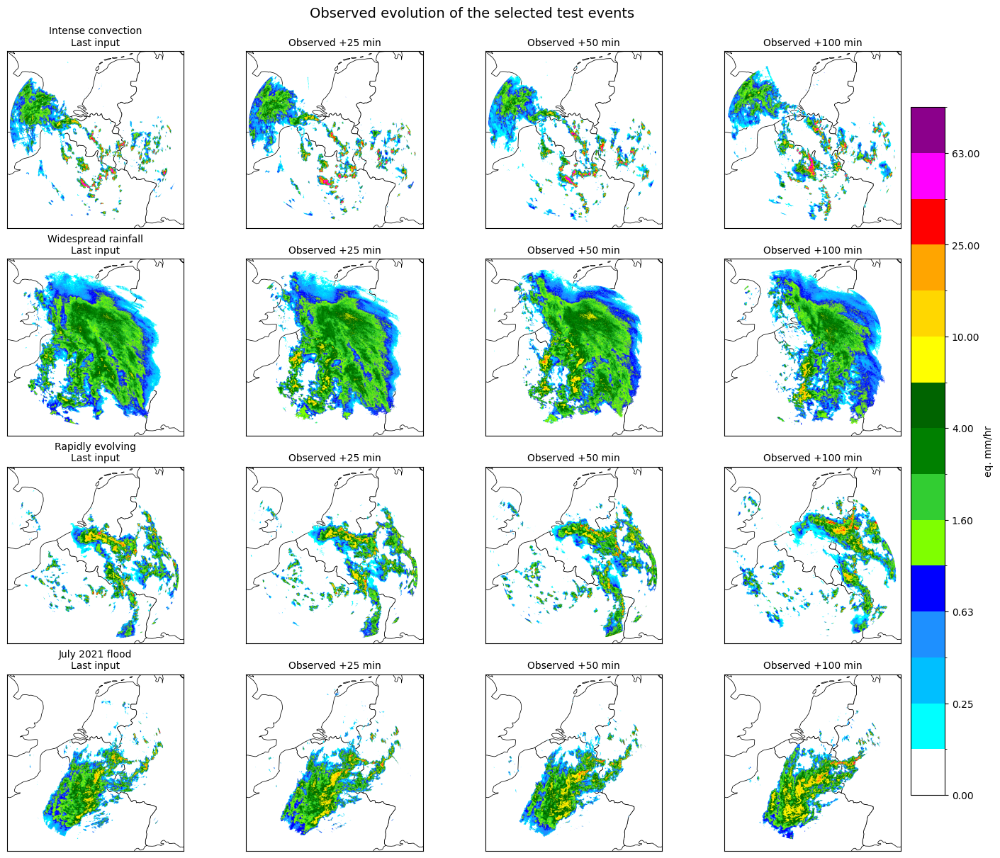

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_deterministic_and_extrapolation_comparison_t465264.png


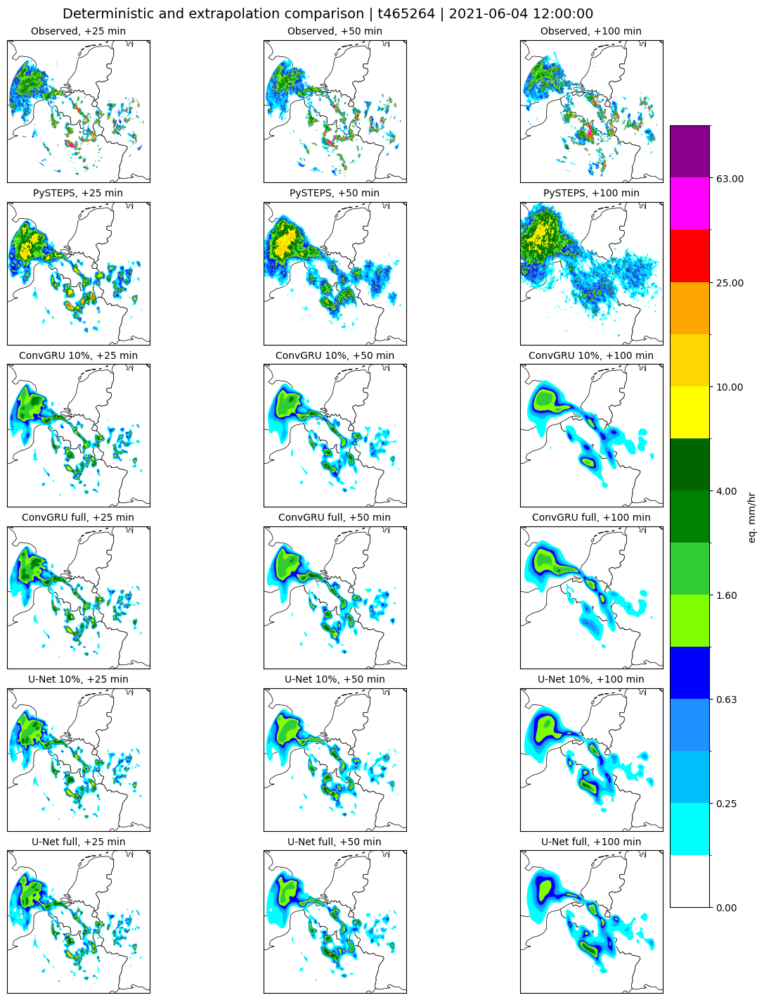

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_probabilistic_ensemble_mean_comparison_t465264.png


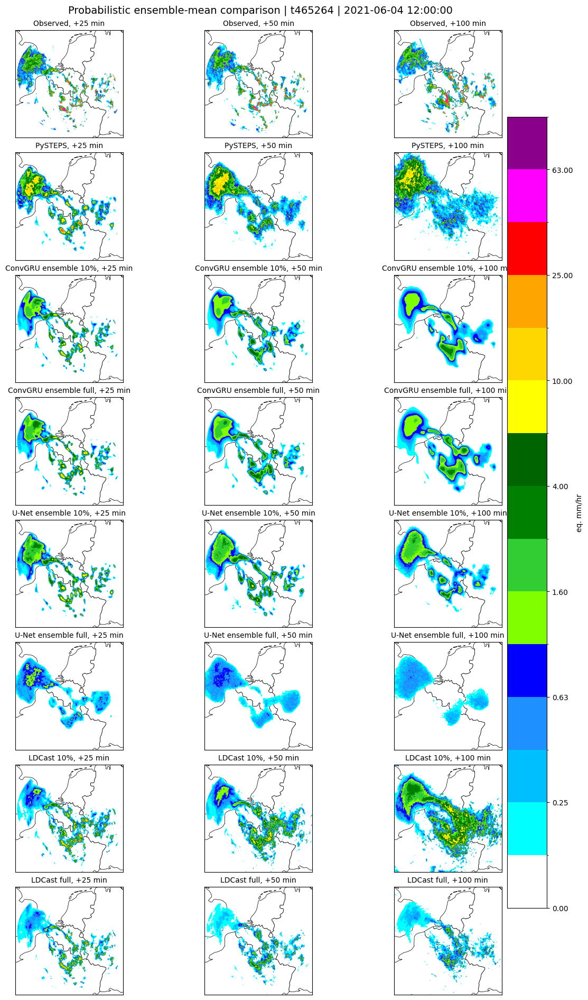

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_deterministic_and_extrapolation_comparison_t428616.png


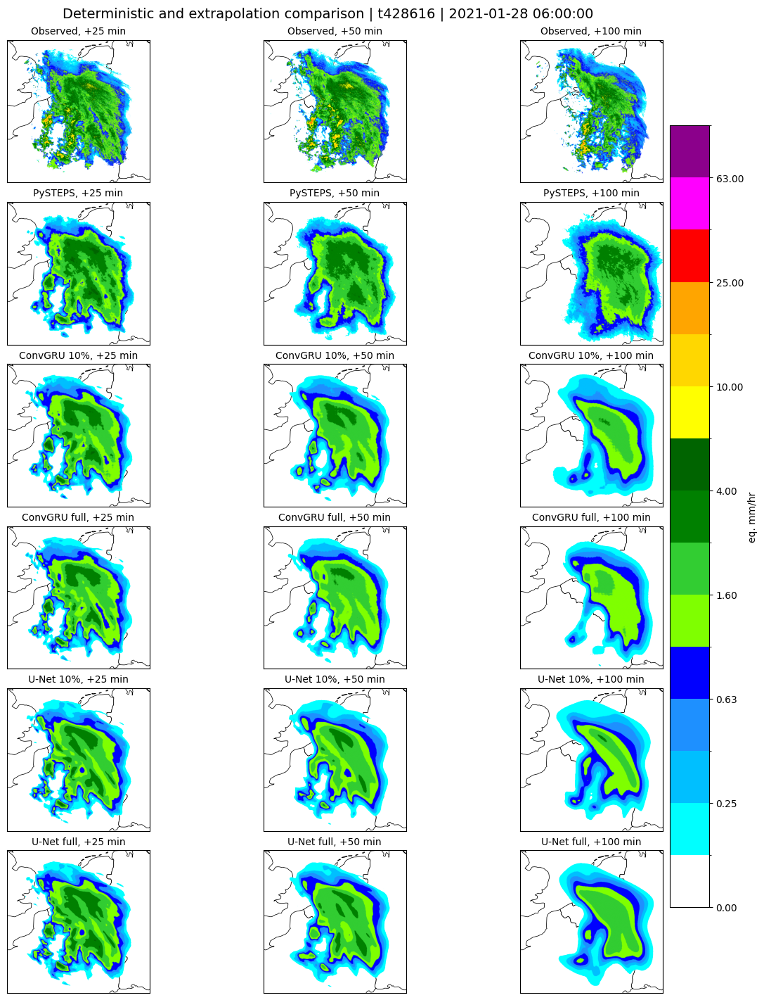

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_probabilistic_ensemble_mean_comparison_t428616.png


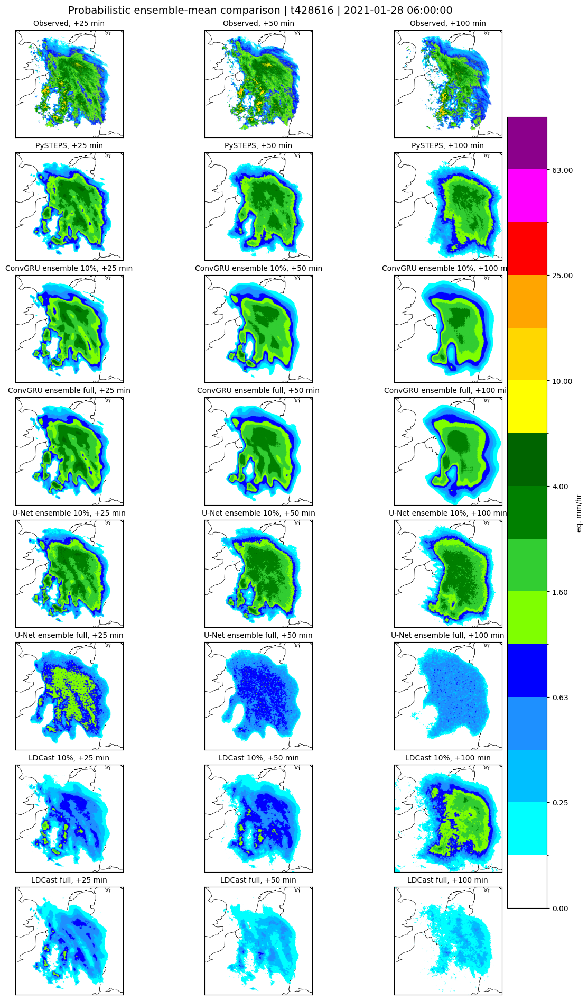

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_deterministic_and_extrapolation_comparison_t473904.png


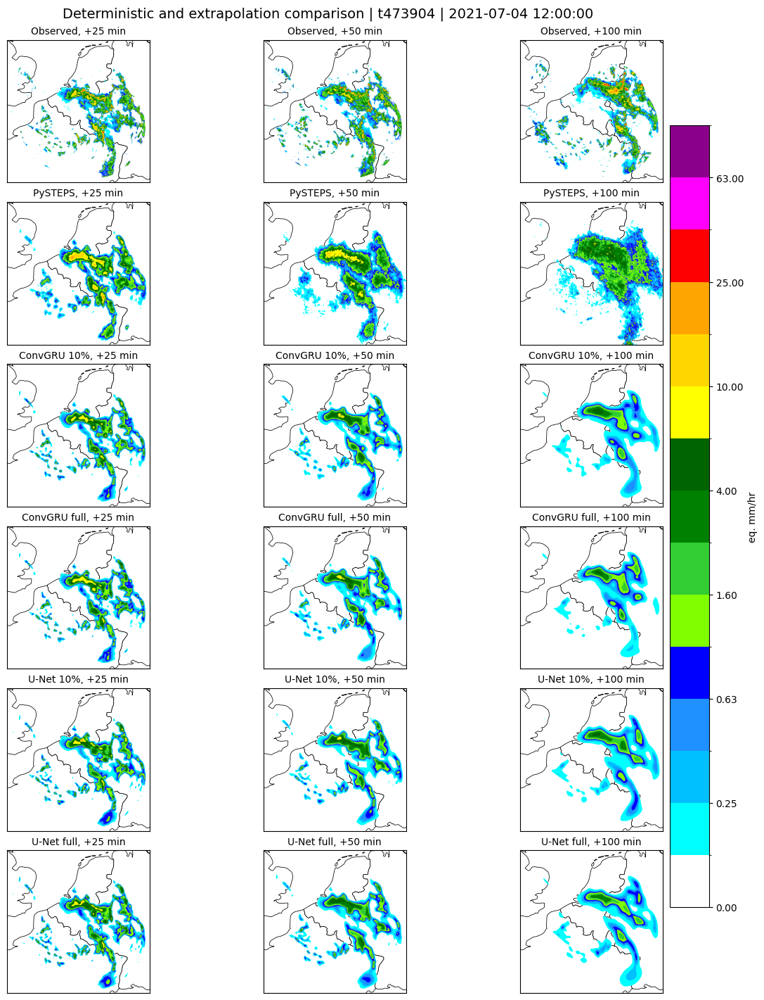

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_probabilistic_ensemble_mean_comparison_t473904.png


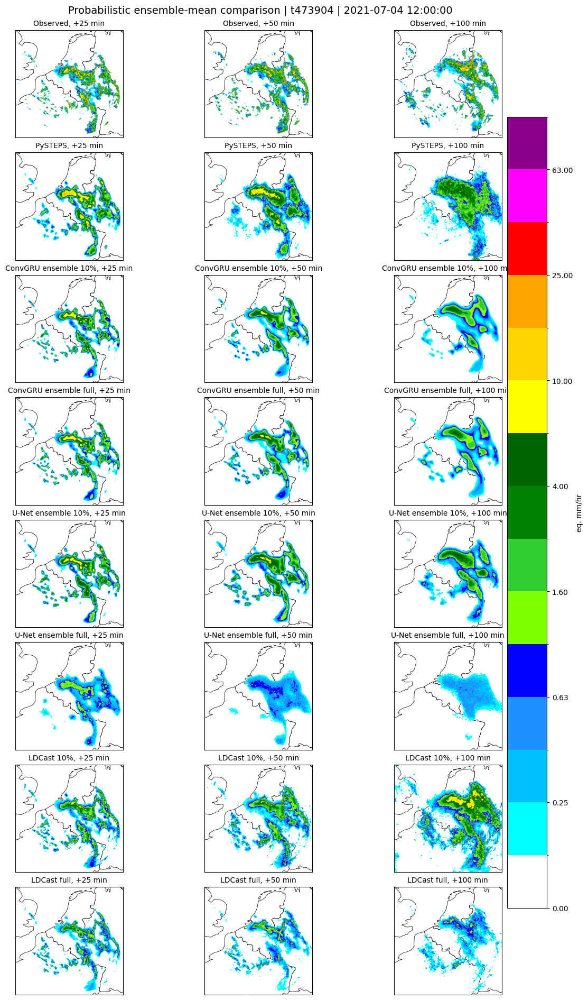

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_deterministic_and_extrapolation_comparison_t476568.png


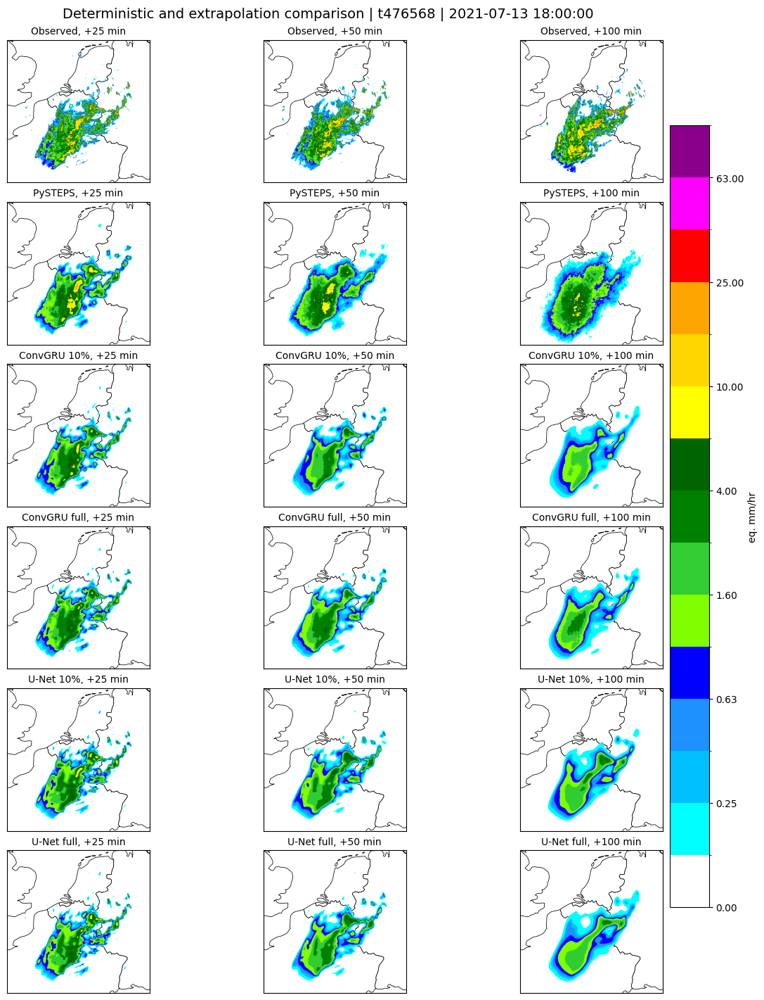

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_probabilistic_ensemble_mean_comparison_t476568.png


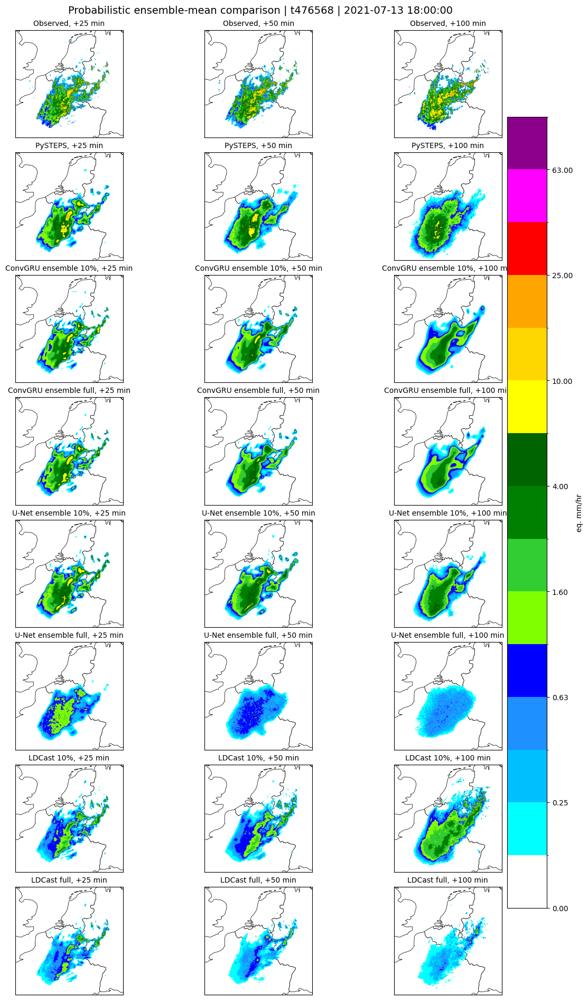

Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/qual_ensemble_members_t465264_lead100.png


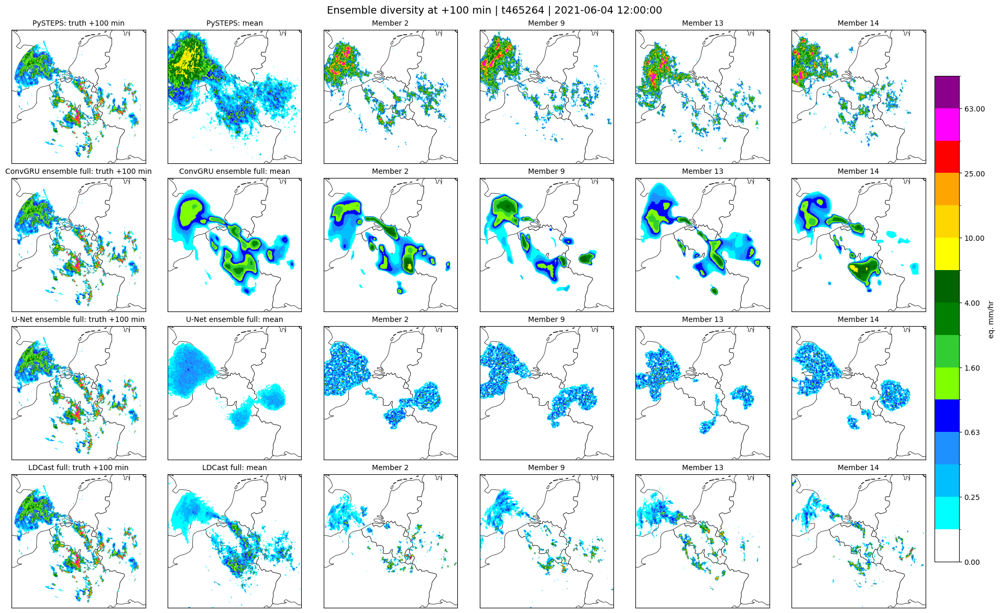


Qualitative figures saved under: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures
  qual_context_truth_t428616.png
  qual_context_truth_t465264.png
  qual_context_truth_t473904.png
  qual_context_truth_t476568.png
  qual_deterministic_and_extrapolation_comparison_t428616.png
  qual_deterministic_and_extrapolation_comparison_t465264.png
  qual_deterministic_and_extrapolation_comparison_t473904.png
  qual_deterministic_and_extrapolation_comparison_t476568.png
  qual_ensemble_members_t465264_lead100.png
  qual_observation_overview.png
  qual_probabilistic_ensemble_mean_comparison_t428616.png
  qual_probabilistic_ensemble_mean_comparison_t465264.png
  qual_probabilistic_ensemble_mean_comparison_t473904.png
  qual_probabilistic_ensemble_mean_comparison_t476568.png


In [9]:
# ============================================================
# Generate only the qualitative figures used in the thesis
# ============================================================

# Figure 4.2-style observation overview.
plot_all_event_observation_overview()

# Deterministic/extrapolation and probabilistic ensemble-mean figures.
for t_start in EVAL_EVENT_TS:
    plot_event_model_grid(
        t_start,
        DETERMINISTIC_QUAL_MODELS,
        group_name="Deterministic and extrapolation comparison",
    )

    plot_event_model_grid(
        t_start,
        PROBABILISTIC_QUAL_MODELS,
        group_name="Probabilistic ensemble-mean comparison",
    )

# Ensemble-diversity figure for the intense-convection case at +100 min.
plot_ensemble_members_at_lead(
    MAIN_EVENT_T,
    lead_idx=19,
    n_members=4,
)

print("\nQualitative figures saved under:", THESIS_QUAL_DIR)
for path in sorted(THESIS_QUAL_DIR.glob("qual_*.png")):
    print(" ", path.name)

In [11]:
# ============================================================
# DEFENSE SLIDE:
# Classical extrapolation visual example
# WITH SAME MAP BACKGROUND AS QUALITATIVE FIGURES
# ============================================================

from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

from pysteps import motion, extrapolation
from pysteps.utils import transformation


# ------------------------------------------------------------
# Event
# ------------------------------------------------------------

EXAMPLE_T = 465264
ev_key = event_key(EXAMPLE_T)

if ev_key not in full_domain_events:
    raise KeyError(
        f"{ev_key} is not loaded. "
        "Run the event-loading cell first."
    )

event_data = full_domain_events[ev_key]


# ------------------------------------------------------------
# Output folder
# ------------------------------------------------------------

DEFENSE_INTRO_DIR = THESIS_QUAL_DIR / "defense_intro"
DEFENSE_INTRO_DIR.mkdir(parents=True, exist_ok=True)

print("Saving to:")
print(DEFENSE_INTRO_DIR)


# ============================================================
# 1. GET RAIN-RATE SEQUENCE
# ============================================================

if "orig_rr" in event_data:
    rr_all = np.asarray(event_data["orig_rr"], dtype=np.float32)
else:
    rr_all = to_rainrate_np(
        np.asarray(event_data["orig_norm"], dtype=np.float32)
    )

print("Rain-rate sequence:", rr_all.shape)


# ============================================================
# 2. SELECT THE TWO OBSERVATIONS SHOWN ON THE SLIDE
# ============================================================

# index 0 = t-15
# index 1 = t-10
# index 2 = t-5
# index 3 = t

TIN = 4

previous_rr = rr_all[TIN - 2].copy()   # t-5
current_rr  = rr_all[TIN - 1].copy()   # t


# ============================================================
# 3. ESTIMATE THE LUCAS-KANADE MOTION FIELD
# ============================================================

RAIN_THRESHOLD_MM_H = 0.1
DRY_VALUE_DBR = -15.0
RAIN_THRESHOLD_DBR = -10.0   # 10*log10(0.1)

past_rr = np.asarray(rr_all[:TIN], dtype=np.float32).copy()

past_dbr, _ = transformation.dB_transform(
    past_rr,
    threshold=RAIN_THRESHOLD_MM_H,
    zerovalue=DRY_VALUE_DBR,
)

past_dbr = np.asarray(past_dbr, dtype=np.float32)
past_dbr[~np.isfinite(past_dbr)] = DRY_VALUE_DBR

oflow_method = motion.get_method("LK")

velocity = np.asarray(
    oflow_method(past_dbr),
    dtype=np.float32,
)

print("Velocity shape:", velocity.shape)
print("Velocity finite:", np.isfinite(velocity).all())


# ============================================================
# 4. CREATE A DETERMINISTIC EXTRAPOLATED FUTURE
# ============================================================

N_EXTRAP_STEPS = 5   # +5, +10, +15, +20, +25 min

extrapolate_method = extrapolation.get_method("semilagrangian")

current_dbr = past_dbr[-1].copy()

print("Current dBR finite:", np.isfinite(current_dbr).all())

future_dbr_sequence = extrapolate_method(
    current_dbr,
    velocity,
    N_EXTRAP_STEPS,
)

future_dbr_sequence = np.asarray(
    future_dbr_sequence,
    dtype=np.float32,
)

future_dbr_sequence[~np.isfinite(future_dbr_sequence)] = DRY_VALUE_DBR

future_rr_sequence, _ = transformation.dB_transform(
    future_dbr_sequence,
    threshold=RAIN_THRESHOLD_DBR,
    inverse=True,
)

future_rr_sequence = np.asarray(
    future_rr_sequence,
    dtype=np.float32,
)

future_rr_sequence = np.where(
    np.isfinite(future_rr_sequence),
    np.maximum(future_rr_sequence, 0.0),
    np.nan,
).astype(np.float32)

future_rr = future_rr_sequence[-1]   # +25 min

print("Future finite:", np.isfinite(future_rr).any())


# ============================================================
# 5. CHOOSE A COMMON CROP
# ============================================================

combined_rain = (
    (np.nan_to_num(previous_rr, nan=0.0) >= 0.1)
    |
    (np.nan_to_num(current_rr, nan=0.0) >= 0.1)
    |
    (np.nan_to_num(future_rr, nan=0.0) >= 0.1)
)

ys, xs = np.where(combined_rain)

if len(xs) == 0:
    y0, y1 = 0, current_rr.shape[0]
    x0, x1 = 0, current_rr.shape[1]
else:
    margin = 35

    y0 = max(0, int(ys.min()) - margin)
    y1 = min(current_rr.shape[0], int(ys.max()) + margin + 1)

    x0 = max(0, int(xs.min()) - margin)
    x1 = min(current_rr.shape[1], int(xs.max()) + margin + 1)

height = y1 - y0
width = x1 - x0
side = max(height, width)

cy = (y0 + y1) // 2
cx = (x0 + x1) // 2

y0 = max(0, cy - side // 2)
y1 = min(current_rr.shape[0], y0 + side)

x0 = max(0, cx - side // 2)
x1 = min(current_rr.shape[1], x0 + side)

side = min(y1 - y0, x1 - x0)
y1 = y0 + side
x1 = x0 + side

print("Crop:", f"x={x0}:{x1}", f"y={y0}:{y1}")


# ============================================================
# 6. HELPER FUNCTIONS
# ============================================================

def masked_precip(field, min_visible=0.08):
    """
    Keep only meaningful rain visible so the map can be seen behind it.
    """
    arr = np.asarray(field, dtype=np.float32).copy()
    arr[~np.isfinite(arr)] = np.nan
    return np.ma.masked_where(~np.isfinite(arr) | (arr < min_visible), arr)


def add_same_map_background(ax):
    """
    Draw exactly the same country background used by
    the qualitative figures.
    """
    height, width = current_rr.shape[-2:]

    _country_background_for_shape(height, width).plot(
        ax=ax,
        facecolor="white",
        edgecolor="black",
        linewidth=0.55,
        zorder=0,
        aspect="equal",
    )

    ax.set_xlim(x0, x1)
    ax.set_ylim(y1, y0)
    ax.set_xticks([])
    ax.set_yticks([])


def save_precip_panel_with_map(field, output_path):
    fig, ax = plt.subplots(figsize=(4, 4), dpi=180)

    add_same_map_background(ax)

    ax.imshow(
        masked_precip(field, min_visible=0.08),
        origin="upper",
        cmap=PRECIP_CMAP,
        norm=PRECIP_NORM,
        interpolation="nearest",
        zorder=3,
    )

    ax.set_xlim(x0, x1)
    ax.set_ylim(y1, y0)
    ax.axis("off")

    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)

    fig.savefig(
        output_path,
        dpi=180,
        facecolor="white",
        bbox_inches=None,
        pad_inches=0,
    )

    plt.close(fig)


# ============================================================
# 7. SAVE OBSERVATION + FUTURE PANELS
# ============================================================

save_precip_panel_with_map(
    previous_rr,
    DEFENSE_INTRO_DIR / "nowcast_obs_previous.png",
)

save_precip_panel_with_map(
    current_rr,
    DEFENSE_INTRO_DIR / "nowcast_obs_current.png",
)

save_precip_panel_with_map(
    future_rr,
    DEFENSE_INTRO_DIR / "nowcast_future.png",
)


# ============================================================
# 8. SAVE MOTION-FIELD PANEL WITH MAP BACKGROUND
# ============================================================

fig, ax = plt.subplots(figsize=(4, 4), dpi=180)

add_same_map_background(ax)

# faint rainfall for context
ax.imshow(
    masked_precip(current_rr, min_visible=0.08),
    origin="upper",
    cmap=PRECIP_CMAP,
    norm=PRECIP_NORM,
    interpolation="nearest",
    alpha=0.35,
    zorder=2,
)

yy, xx = np.mgrid[
    0:current_rr.shape[0],
    0:current_rr.shape[1],
]

# Less dense arrows than before
QUIVER_STEP = 28
VECTOR_MULTIPLIER = 3.5

sl = (
    slice(y0, y1, QUIVER_STEP),
    slice(x0, x1, QUIVER_STEP),
)

u = velocity[0] * VECTOR_MULTIPLIER
v = velocity[1] * VECTOR_MULTIPLIER

ax.quiver(
    xx[sl],
    yy[sl],
    u[sl],
    v[sl],
    color="black",
    angles="xy",
    scale_units="xy",
    scale=1,
    width=0.004,
    headwidth=4.0,
    headlength=5.0,
    zorder=4,
)

ax.set_xlim(x0, x1)
ax.set_ylim(y1, y0)
ax.axis("off")

plt.subplots_adjust(left=0, right=1, bottom=0, top=1)

fig.savefig(
    DEFENSE_INTRO_DIR / "nowcast_motion_field.png",
    dpi=180,
    facecolor="white",
    bbox_inches=None,
    pad_inches=0,
)

plt.close(fig)


# ============================================================
# 9. PREVIEW
# ============================================================

print("\nCreated:")
for filename in [
    "nowcast_obs_previous.png",
    "nowcast_obs_current.png",
    "nowcast_motion_field.png",
    "nowcast_future.png",
]:
    path = DEFENSE_INTRO_DIR / filename
    print(filename, "|", path, "|", f"{path.stat().st_size / 1024:.1f} KB")

Saving to:
/data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_intro
Rain-rate sequence: (24, 704, 704)
Velocity shape: (2, 704, 704)
Velocity finite: True
Current dBR finite: True
Future finite: True
Crop: x=0:704 y=0:704

Created:
nowcast_obs_previous.png | /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_intro/nowcast_obs_previous.png | 123.9 KB
nowcast_obs_current.png | /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_intro/nowcast_obs_current.png | 126.3 KB
nowcast_motion_field.png | /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_intro/nowcast_motion_field.png | 205.9 KB
nowcast_future.png | /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_intro/nowcast_future.png | 119.4 KB


In [9]:
print("MAIN_EVENT_T =", MAIN_EVENT_T)

cases = collect_cases_for_event(MAIN_EVENT_T)

print("\nAvailable cases:")
for k in cases:
    print(" -", k)

MAIN_EVENT_T = 465264

Available cases:
 - PySTEPS
 - ConvGRU 10%
 - ConvGRU full
 - ConvGRU ensemble 10%
 - ConvGRU ensemble full
 - U-Net 10%
 - U-Net full
 - U-Net ensemble 10%
 - U-Net ensemble full
 - LDCast 10%
 - LDCast full


In [24]:
from matplotlib.gridspec import GridSpec

# ============================================================
# 6. GENERATE 20 FRAMES
# ============================================================

frame_paths = []

for lead_idx in range(TOUT):

    lead_min = (lead_idx + 1) * 5

    # --------------------------------------------------------
    # Figure + layout
    # Top row: observed only
    # Bottom row: 4 model forecasts
    # Last narrow column: shared colorbar
    # --------------------------------------------------------

    fig = plt.figure(
        figsize=(14.5, 7.6),
        constrained_layout=True,
    )

    gs = fig.add_gridspec(
        2,
        5,
        width_ratios=[1, 1, 1, 1, 0.06],
        height_ratios=[1.05, 1.0],
        wspace=0.05,
        hspace=0.08,
    )

    # Top: observed, centered and larger
    ax_obs = fig.add_subplot(gs[0, 1:3])

    # Bottom: forecasts
    ax_steps = fig.add_subplot(gs[1, 0])
    ax_convgru = fig.add_subplot(gs[1, 1])
    ax_unet = fig.add_subplot(gs[1, 2])
    ax_ldcast = fig.add_subplot(gs[1, 3])

    # Shared colorbar axis
    cax = fig.add_subplot(gs[:, 4])

    # --------------------------------------------------------
    # Observation
    # --------------------------------------------------------

    im = imshow_precip(
        ax_obs,
        truth_rr[lead_idx],
        title="Observed",
    )

    # --------------------------------------------------------
    # Model ensemble means
    # --------------------------------------------------------

    forecast_axes = [
        ax_steps,
        ax_convgru,
        ax_unet,
        ax_ldcast,
    ]

    forecast_models = [
        "PySTEPS",
        "ConvGRU ensemble 10%",
        "U-Net ensemble 10%",
        "LDCast 10%",
    ]

    for ax, model_name in zip(forecast_axes, forecast_models):

        im = imshow_precip(
            ax,
            model_means[model_name][lead_idx],
            title=display_names[model_name],
        )

    # --------------------------------------------------------
    # Main title + row label
    # --------------------------------------------------------

    fig.suptitle(
        f"{EVENT_REGIME_LABELS[ANIMATION_EVENT_T]} — +{lead_min} min",
        fontsize=16,
        fontweight="bold",
    )

    fig.text(
        0.5,
        0.49,
        "Forecast ensemble means",
        ha="center",
        va="center",
        fontsize=12,
        fontweight="bold",
    )

    # --------------------------------------------------------
    # One common colour bar
    # --------------------------------------------------------

    cbar = fig.colorbar(
        im,
        cax=cax,
    )

    cbar.set_label(PRECIP_UNITS)

    # --------------------------------------------------------
    # Save
    # --------------------------------------------------------

    frame_path = ANIMATION_DIR / f"frame_{lead_idx + 1:02d}.png"

    fig.savefig(
        frame_path,
        dpi=140,
        facecolor="white",
        bbox_inches="tight",
    )

    plt.close(fig)

    frame_paths.append(frame_path)

    print(
        f"Saved {lead_idx + 1:02d}/20 "
        f"| +{lead_min:3d} min "
        f"| {frame_path.name}"
    )

print("\nFinished generating animation frames.")
print("Folder:")
print(ANIMATION_DIR)

Saved 01/20 | +  5 min | frame_01.png
Saved 02/20 | + 10 min | frame_02.png
Saved 03/20 | + 15 min | frame_03.png
Saved 04/20 | + 20 min | frame_04.png
Saved 05/20 | + 25 min | frame_05.png
Saved 06/20 | + 30 min | frame_06.png
Saved 07/20 | + 35 min | frame_07.png
Saved 08/20 | + 40 min | frame_08.png
Saved 09/20 | + 45 min | frame_09.png
Saved 10/20 | + 50 min | frame_10.png
Saved 11/20 | + 55 min | frame_11.png
Saved 12/20 | + 60 min | frame_12.png
Saved 13/20 | + 65 min | frame_13.png
Saved 14/20 | + 70 min | frame_14.png
Saved 15/20 | + 75 min | frame_15.png
Saved 16/20 | + 80 min | frame_16.png
Saved 17/20 | + 85 min | frame_17.png
Saved 18/20 | + 90 min | frame_18.png
Saved 19/20 | + 95 min | frame_19.png
Saved 20/20 | +100 min | frame_20.png

Finished generating animation frames.
Folder:
/data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_animation_july_flood


In [25]:
# ============================================================
# PATCH:
# Load ONE individual U-Net ensemble 10% member
# from the existing 20-member SLURM Zarr
#
# NO MODEL INFERENCE IS RUN HERE.
# ============================================================

import zarr
import numpy as np
import gc

ANIMATION_EVENT_T = 476568
ev_key = event_key(ANIMATION_EVENT_T)

MODEL_NAME = "U-Net ensemble 10%"

# zero-based:
# 0 = member 1
# 1 = member 2
# etc.
ORIGINAL_MEMBER_INDEX = 1


# ------------------------------------------------------------
# Open existing 20-member Zarr
# ------------------------------------------------------------

zarr_path = UNET_ENS_ZARRS[MODEL_NAME]

print("Opening:")
print(zarr_path)

root = zarr.open_group(
    str(zarr_path),
    mode="r",
)

forecast = root["forecast"]

print("Forecast shape:", forecast.shape)

# Expected:
# [event, member, lead, y, x]
assert len(forecast.shape) == 5
assert forecast.shape[1] == 20
assert forecast.shape[2] == TOUT


# ------------------------------------------------------------
# Find the event index safely
# ------------------------------------------------------------

if "t_start" in root:

    zarr_t_starts = np.asarray(
        root["t_start"][:]
    ).astype(int)

    matches = np.where(
        zarr_t_starts == int(ANIMATION_EVENT_T)
    )[0]

    if len(matches) != 1:
        raise RuntimeError(
            f"Expected exactly one match for "
            f"t={ANIMATION_EVENT_T}, got {matches}"
        )

    event_idx = int(matches[0])

else:

    # fallback: use ordering already used by notebook
    event_idx = [
        int(t) for t in EVAL_EVENT_TS
    ].index(int(ANIMATION_EVENT_T))


print(
    "Event:",
    ev_key,
    "| event index:",
    event_idx,
    "| member:",
    ORIGINAL_MEMBER_INDEX,
)


# ------------------------------------------------------------
# Read ONE member
#
# Zarr is already in physical rain rate [mm/h].
# Shape after reading:
# [lead, y, x]
# ------------------------------------------------------------

member_rr = np.asarray(
    forecast[
        event_idx,
        ORIGINAL_MEMBER_INDEX,
        :,
        :,
        :
    ],
    dtype=np.float32,
)

print("Loaded member rain-rate shape:", member_rr.shape)

assert member_rr.shape == (
    TOUT,
    704,
    704,
)


# ------------------------------------------------------------
# Existing notebook stores "samples" in normalized dBZ space,
# so convert before adding to the case dictionary.
# ------------------------------------------------------------

member_norm = rainrate_to_norm_dbz_np(
    member_rr
)

# Add member dimension:
# [1, lead, y, x]
member_norm = member_norm[None, ...]


# ------------------------------------------------------------
# Add it to the EXISTING U-Net ensemble 10% case
# ------------------------------------------------------------

case = unet_cases_by_event[
    ev_key
][MODEL_NAME]

case["samples"] = member_norm

case["stored_member_indices"] = np.asarray(
    [ORIGINAL_MEMBER_INDEX],
    dtype=np.int16,
)


print("\nUpdated case keys:")
print(list(case.keys()))

print(
    "samples:",
    case["samples"].shape,
)

print(
    "stored original member index:",
    case["stored_member_indices"],
)

print(
    "\nU-Net ensemble 10% individual member is ready."
)


# ------------------------------------------------------------
# Clean Zarr references
# ------------------------------------------------------------

del member_rr, member_norm
del forecast, root

gc.collect()

Opening:
/scratch/brussel/114/vsc11442/mlcast_predictions/qualitative_2021/unet_ens_10pct_m20.zarr
Forecast shape: (4, 20, 20, 704, 704)
Event: t476568 | event index: 3 | member: 1
Loaded member rain-rate shape: (20, 704, 704)

Updated case keys:
['past', 'truth', 'pred_mean_rr', 'tin', 'tout', 'n_members', 't_start', 'model_name', 'mode', 'samples', 'stored_member_indices']
samples: (1, 20, 704, 704)
stored original member index: [1]

U-Net ensemble 10% individual member is ready.


330377

In [26]:
# ============================================================
# PREPARE ONE INDIVIDUAL MEMBER FROM EACH MODEL
# FOR THE DEFENSE ANIMATION
# ============================================================

ANIMATION_EVENT_T = 476568
ev_key = event_key(ANIMATION_EVENT_T)

# We use original ensemble member index 1
# (= "member 2" when counting from 1).
ORIGINAL_MEMBER_INDEX = 1


# ============================================================
# Collect cases
# ============================================================

animation_cases = {
    "PySTEPS":
        pysteps_cases_by_event[
            ev_key
        ]["PySTEPS"],

    "ConvGRU ensemble 10%":
        convgru_cases_by_event[
            ev_key
        ]["ConvGRU ensemble 10%"],

    "U-Net ensemble 10%":
        unet_cases_by_event[
            ev_key
        ]["U-Net ensemble 10%"],

    "LDCast 10%":
        ldcast_cases_by_event[
            ev_key
        ]["10%"],
}


# ============================================================
# Helper:
# extract requested ORIGINAL ensemble member
# ============================================================

def get_original_member_rainrate(
    case,
    original_member_index,
):

    keys = get_case_keys(case)

    if "samples" not in keys:
        raise KeyError(
            "This case does not contain stored samples. "
            f"Available keys: {keys}"
        )

    samples_norm = np.asarray(
        case["samples"],
        dtype=np.float32,
    )

    # --------------------------------------------------------
    # Some cases contain all 20 members.
    # Others, e.g. PySTEPS, contain only selected members
    # together with their original indices.
    # --------------------------------------------------------

    if "stored_member_indices" in keys:

        stored_indices = np.asarray(
            case["stored_member_indices"]
        ).astype(int)

        matches = np.where(
            stored_indices == original_member_index
        )[0]

        if len(matches) == 0:
            raise ValueError(
                f"Original member {original_member_index} "
                f"is not stored. Available original indices: "
                f"{stored_indices.tolist()}"
            )

        local_idx = int(matches[0])

    else:

        # All members are stored in original order.
        local_idx = int(original_member_index)

        if local_idx >= samples_norm.shape[0]:
            raise IndexError(
                f"Requested member {original_member_index}, "
                f"but only {samples_norm.shape[0]} members "
                f"are available."
            )

    # normalized dBZ -> mm/h
    member_rr = to_rainrate_np(
        samples_norm[local_idx].copy()
    )

    return member_rr


# ============================================================
# Build dictionary:
# [lead, y, x] for every model
# ============================================================

model_member_rr = {}

for model_name, case in animation_cases.items():

    model_member_rr[model_name] = (
        get_original_member_rainrate(
            case,
            ORIGINAL_MEMBER_INDEX,
        )
    )

    print(
        f"{model_name:24s}",
        "->",
        model_member_rr[model_name].shape,
    )


print(
    "\nIndividual member preparation complete."
)

print(
    "Using original ensemble member index:",
    ORIGINAL_MEMBER_INDEX,
    "(displayed as member",
    ORIGINAL_MEMBER_INDEX + 1,
    ")"
)

PySTEPS                  -> (20, 704, 704)
ConvGRU ensemble 10%     -> (20, 704, 704)
U-Net ensemble 10%       -> (20, 704, 704)
LDCast 10%               -> (20, 704, 704)

Individual member preparation complete.
Using original ensemble member index: 1 (displayed as member 2 )


## DEFENSE ANIMATION — JULY 2021 FLOOD EVENT

In [27]:
FLOOD_EVENT_T = 476568
ANIMATION_EVENT_T = FLOOD_EVENT_T

ev_key = event_key(ANIMATION_EVENT_T)

print(
    "Animation event:",
    EVENT_REGIME_LABELS[ANIMATION_EVENT_T],
    "|",
    EVENT_LABELS[ANIMATION_EVENT_T],
    "| t_start =",
    ANIMATION_EVENT_T,
)


# ------------------------------------------------------------
# Separate output folder
# ------------------------------------------------------------

ANIMATION_DIR = (
    THESIS_QUAL_DIR
    / "defense_animation_july_flood"
)

ANIMATION_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

print("Saving animation frames to:")
print(ANIMATION_DIR)


# ------------------------------------------------------------
# Collect flood-event cases
# ------------------------------------------------------------

cases = collect_cases_for_event(
    ANIMATION_EVENT_T
)

required_models = [
    "PySTEPS",
    "ConvGRU ensemble 10%",
    "U-Net ensemble 10%",
    "LDCast 10%",
]

missing = [
    name
    for name in required_models
    if name not in cases
]

if missing:
    raise KeyError(
        "Missing cases: "
        + ", ".join(missing)
    )


# ------------------------------------------------------------
# Common observation
# ------------------------------------------------------------

truth_rr = case_truth_rainrate(
    cases["PySTEPS"]
)


# ------------------------------------------------------------
# Ensemble means
# ------------------------------------------------------------

model_means = {
    model_name:
        case_ensemble_mean_rainrate(
            cases[model_name]
        )
    for model_name in required_models
}


display_names = {
    "PySTEPS": "STEPS",
    "ConvGRU ensemble 10%": "ConvGRU ens. 10%",
    "U-Net ensemble 10%": "U-Net ens. 10%",
    "LDCast 10%": "LDCast 10%",
}

print("Truth:", truth_rr.shape)

for name, arr in model_means.items():
    print(name, arr.shape)

Animation event: July 2021 flood event | 2021-07-13 18:00:00 | t_start = 476568
Saving animation frames to:
/data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_animation_july_flood
Truth: (20, 704, 704)
PySTEPS (20, 704, 704)
ConvGRU ensemble 10% (20, 704, 704)
U-Net ensemble 10% (20, 704, 704)
LDCast 10% (20, 704, 704)


In [31]:
from matplotlib.gridspec import GridSpec

# ============================================================
# GENERATE 20 FRAMES — ONE INDIVIDUAL MEMBER
# ============================================================

frame_paths_member = []

for lead_idx in range(TOUT):

    lead_min = (lead_idx + 1) * 5

    fig = plt.figure(
        figsize=(14.5, 7.6),
        constrained_layout=True,
    )

    gs = fig.add_gridspec(
        2,
        5,
        width_ratios=[1, 1, 1, 1, 0.06],
        height_ratios=[1.05, 1.0],
        wspace=0.05,
        hspace=0.08,
    )

    # Top
    ax_obs = fig.add_subplot(gs[0, 1:3])

    # Bottom
    ax_steps = fig.add_subplot(gs[1, 0])
    ax_convgru = fig.add_subplot(gs[1, 1])
    ax_unet = fig.add_subplot(gs[1, 2])
    ax_ldcast = fig.add_subplot(gs[1, 3])

    cax = fig.add_subplot(gs[:, 4])


    # --------------------------------------------------------
    # Observation
    # --------------------------------------------------------

    im = imshow_precip(
        ax_obs,
        truth_rr[lead_idx],
        title="Observed",
    )


    # --------------------------------------------------------
    # Individual forecasts
    # --------------------------------------------------------

    forecast_axes = [
        ax_steps,
        ax_convgru,
        ax_unet,
        ax_ldcast,
    ]

    forecast_models = [
        "PySTEPS",
        "ConvGRU ensemble 10%",
        "U-Net ensemble 10%",
        "LDCast 10%",
    ]

    for ax, model_name in zip(
        forecast_axes,
        forecast_models,
    ):

        im = imshow_precip(
            ax,
            model_member_rr[
                model_name
            ][lead_idx],
            title=display_names[
                model_name
            ],
        )


    # --------------------------------------------------------
    # Titles
    # --------------------------------------------------------

    fig.suptitle(
        f"July 2021 flood event — +{lead_min} min",
        fontsize=16,
        fontweight="bold",
    )

    fig.text(
        0.5,
        0.49,
        "Example ensemble member from each model",
        ha="center",
        va="center",
        fontsize=12,
        fontweight="bold",
    )


    # --------------------------------------------------------
    # Colour bar
    # --------------------------------------------------------

    cbar = fig.colorbar(
        im,
        cax=cax,
    )

    cbar.set_label(
        PRECIP_UNITS
    )


    # --------------------------------------------------------
    # Save
    # --------------------------------------------------------

    frame_path = (
        ANIMATION_DIR
        / f"frame_member_{lead_idx + 1:02d}.png"
    )

    fig.savefig(
        frame_path,
        dpi=140,
        facecolor="white",
        bbox_inches="tight",
    )

    plt.close(fig)

    frame_paths_member.append(
        frame_path
    )

    print(
        f"Saved {lead_idx + 1:02d}/20 "
        f"| +{lead_min:3d} min "
        f"| {frame_path.name}"
    )


print(
    "\nFinished generating individual-member frames."
)

print(
    "Folder:",
    ANIMATION_DIR
)

Saved 01/20 | +  5 min | frame_member_01.png
Saved 02/20 | + 10 min | frame_member_02.png
Saved 03/20 | + 15 min | frame_member_03.png
Saved 04/20 | + 20 min | frame_member_04.png
Saved 05/20 | + 25 min | frame_member_05.png
Saved 06/20 | + 30 min | frame_member_06.png
Saved 07/20 | + 35 min | frame_member_07.png
Saved 08/20 | + 40 min | frame_member_08.png
Saved 09/20 | + 45 min | frame_member_09.png
Saved 10/20 | + 50 min | frame_member_10.png
Saved 11/20 | + 55 min | frame_member_11.png
Saved 12/20 | + 60 min | frame_member_12.png
Saved 13/20 | + 65 min | frame_member_13.png
Saved 14/20 | + 70 min | frame_member_14.png
Saved 15/20 | + 75 min | frame_member_15.png
Saved 16/20 | + 80 min | frame_member_16.png
Saved 17/20 | + 85 min | frame_member_17.png
Saved 18/20 | + 90 min | frame_member_18.png
Saved 19/20 | + 95 min | frame_member_19.png
Saved 20/20 | +100 min | frame_member_20.png

Finished generating individual-member frames.
Folder: /data/brussel/114/vsc11442/code/mlcast-ldcast

In [32]:
from pathlib import Path
from PIL import Image


def make_gif(frame_paths, output_path, duration=1000):

    frame_paths = sorted(frame_paths)

    if not frame_paths:
        raise ValueError("No frames found.")

    print(f"Creating {output_path.name}")
    print(f"Frames: {len(frame_paths)}")

    frames = [
        Image.open(path).convert("RGB")
        for path in frame_paths
    ]

    frames[0].save(
        output_path,
        save_all=True,
        append_images=frames[1:],
        duration=duration,
        loop=0,
        disposal=2,
        optimize=False,
    )

    print("Saved:", output_path)


# Folder
frame_dir = THESIS_QUAL_DIR / "defense_animation_july_flood"

# Ensemble means
make_gif(
    frame_dir.glob("frame_[0-9][0-9].png"),
    frame_dir / "ensemble_mean_animation.gif",
)

# Single ensemble member
make_gif(
    frame_dir.glob("frame_member_[0-9][0-9].png"),
    frame_dir / "single_member_animation.gif",
)

Creating ensemble_mean_animation.gif
Frames: 20
Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_animation_july_flood/ensemble_mean_animation.gif
Creating single_member_animation.gif
Frames: 20
Saved: /data/brussel/114/vsc11442/code/mlcast-ldcast/results/qualitative_figures/defense_animation_july_flood/single_member_animation.gif
